# Perturbation Based On Ocean Currents for Ensemble Based Calibration. #

---
---
# Load data #
Load *GLORYS12* data which will be the truth of the perturbation

In [1]:
import xarray as xr

In [2]:
ncpath = "/Odyssey/public/glonet/glorys12_1993-01-01_to_1993-06-30_init_states/combined_input.nc"

ds_total = xr.open_dataset(ncpath, chunks={"time": 15,  "lat": 96, "lon": 96})

# Extract input sequences for Glonet
ds = ds_total.isel(time=slice(0,2)).persist()

In [3]:
# ds


# Extract Ocean Current Components. #
Extract Ocean currents for target time. </br>
(Optinal) investigate them by vertical plots.


In [4]:
## Select target 
## Bigger than 0 and less than data length
target_idx = 1

# Need two sets of currents data for t-1 and t
sample_idx_t0 = target_idx - 1
sample_idx_t1 = target_idx

In [5]:
# Create UV dictionary for time t-1
uv_surface_t0 = ds_total["data"].isel(time=sample_idx_t0, ch=slice(3, 5))  # u, v for surface
max_uv_surface_t0 = uv_surface_t0.max(dim=("lat","lon"), skipna=True)
min_uv_surface_t0 = uv_surface_t0.min(dim=("lat","lon"), skipna=True)
mean_uv_surface_t0 = uv_surface_t0.mean(dim=("lat","lon"), skipna=True)
std_uv_surface_t0 = uv_surface_t0.std(dim=("lat","lon"), skipna=True)

uv_depth_t0 = {"d0": uv_surface_t0, 
               "max_d0": max_uv_surface_t0, 
               "min_d0": min_uv_surface_t0, 
               "mean_d0": mean_uv_surface_t0, 
               "std_d0": std_uv_surface_t0}

for depth in range(1, 11):  # T, s, u, v depth states for depth levels 1-10
    uv_depth_da = ds_total["data"].isel(time=sample_idx_t0, ch=[25 + depth, 34 + depth])
    uv_depth_t0[f"d{depth}"] = uv_depth_da
    uv_depth_t0[f"max_d{depth}"] = uv_depth_da.max(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"min_d{depth}"] = uv_depth_da.min(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"mean_d{depth}"] = uv_depth_da.mean(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"std_d{depth}"] = uv_depth_da.std(dim=("lat","lon"), skipna=True)

for depth in range(11, 21):  # T, s, u, v depth states for depth levels 11-20
    uv_depth_da = ds_total["data"].isel(time=sample_idx_t0, ch=[55 + depth, 64 + depth])
    uv_depth_t0[f"d{depth}"] = uv_depth_da
    uv_depth_t0[f"max_d{depth}"] = uv_depth_da.max(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"min_d{depth}"] = uv_depth_da.min(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"mean_d{depth}"] = uv_depth_da.mean(dim=("lat","lon"), skipna=True)
    uv_depth_t0[f"std_d{depth}"] = uv_depth_da.std(dim=("lat","lon"), skipna=True)

# Create UV dictionary for time t
uv_surface_t1 = ds_total["data"].isel(time=sample_idx_t1, ch=slice(3, 5))  # u, v for surface
max_uv_surface_t1 = uv_surface_t1.max(dim=("lat","lon"), skipna=True)
min_uv_surface_t1 = uv_surface_t1.min(dim=("lat","lon"), skipna=True)
mean_uv_surface_t1 = uv_surface_t1.mean(dim=("lat","lon"), skipna=True)
std_uv_surface_t1 = uv_surface_t1.std(dim=("lat","lon"), skipna=True)

uv_depth_t1 = {"d0": uv_surface_t1, 
               "max_d0": max_uv_surface_t1, 
               "min_d0": min_uv_surface_t1, 
               "mean_d0": mean_uv_surface_t1, 
               "std_d0": std_uv_surface_t1}

for depth in range(1, 11):  # T, s, u, v depth states for depth levels 1-10
    uv_depth_da = ds_total["data"].isel(time=sample_idx_t1, ch=[25 + depth, 34 + depth])
    uv_depth_t1[f"d{depth}"] = uv_depth_da
    uv_depth_t1[f"max_d{depth}"] = uv_depth_da.max(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"min_d{depth}"] = uv_depth_da.min(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"mean_d{depth}"] = uv_depth_da.mean(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"std_d{depth}"] = uv_depth_da.std(dim=("lat","lon"), skipna=True)

for depth in range(11, 21):  # T, s, u, v depth states for depth levels 11-20
    uv_depth_da = ds_total["data"].isel(time=sample_idx_t1, ch=[55 + depth, 64 + depth])
    uv_depth_t1[f"d{depth}"] = uv_depth_da
    uv_depth_t1[f"max_d{depth}"] = uv_depth_da.max(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"min_d{depth}"] = uv_depth_da.min(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"mean_d{depth}"] = uv_depth_da.mean(dim=("lat","lon"), skipna=True)
    uv_depth_t1[f"std_d{depth}"] = uv_depth_da.std(dim=("lat","lon"), skipna=True)

print(f"Created UV dictionaries for t-1 (time={sample_idx_t0}) and t (time={sample_idx_t1})")
print(f"Each dictionary contains {len(uv_depth_t0)} items for 21 depth levels (d0 to d20)")


Created UV dictionaries for t-1 (time=0) and t (time=1)
Each dictionary contains 105 items for 21 depth levels (d0 to d20)


## Optional: Plot mean u and v components vs depth ##

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Collect mean, max, and min values for u and v at each depth
depths = list(range(21))
mean_u = []
mean_v = []
max_u = []
max_v = []
min_u = []
min_v = []

for depth in depths:
    mean_vals = uv_depth_t0[f"mean_d{depth}"].values
    max_vals = uv_depth_t0[f"max_d{depth}"].values
    min_vals = uv_depth_t0[f"min_d{depth}"].values
    
    mean_u.append(float(mean_vals[0]))  # First channel is u
    mean_v.append(float(mean_vals[1]))  # Second channel is v
    max_u.append(float(max_vals[0]))
    max_v.append(float(max_vals[1]))
    min_u.append(float(min_vals[0]))
    min_v.append(float(min_vals[1]))

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot u component with max/min range
ax1.fill_betweenx(depths, min_u, max_u, alpha=0.2, color='blue', label='Min-Max Range')
ax1.plot(mean_u, depths, 'b-o', linewidth=2, markersize=6, label='Mean')
ax1.set_ylabel('Depth Level', fontsize=12)
ax1.set_xlabel('U Component (m/s)', fontsize=12)
ax1.set_title('U Component vs Depth', fontsize=14, fontweight='bold')
ax1.invert_yaxis()  # Invert y-axis so surface (0) is at top
ax1.grid(True, alpha=0.3)
ax1.legend()

# Plot v component with max/min range
ax2.fill_betweenx(depths, min_v, max_v, alpha=0.2, color='red', label='Min-Max Range')
ax2.plot(mean_v, depths, 'r-o', linewidth=2, markersize=6, label='Mean')
ax2.set_ylabel('Depth Level', fontsize=12)
ax2.set_xlabel('V Component (m/s)', fontsize=12)
ax2.set_title('V Component vs Depth', fontsize=14, fontweight='bold')
ax2.invert_yaxis()  # Invert y-axis so surface (0) is at top
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.show()

## Optional: Investigate u, v from a random point across depth levels ##

In [ ]:
# Select a random point (avoid NaN values by selecting from valid region)
import numpy as np

# Get a valid point from deepest data
# lastly called uv_depth_da contains deepest data
valid_mask = ~np.isnan(uv_depth_da.isel(ch=1).values)
valid_indices = np.argwhere(valid_mask)
random_idx = np.random.choice(len(valid_indices))
lat_idx, lon_idx = valid_indices[random_idx]

print(f"Random point selected: lat_idx={lat_idx}, lon_idx={lon_idx}")

# Extract u and v values at this point for all depth levels
point_u = []
point_v = []

for depth in range(21):
    uv_at_depth = uv_depth_t0[f"d{depth}"].isel(lat=lat_idx, lon=lon_idx).values
    point_u.append(float(uv_at_depth[0]))
    point_v.append(float(uv_at_depth[1]))

# Create comparison plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot u component with random point
# ax1.fill_betweenx(depths, min_u, max_u, alpha=0.2, color='blue', label='Min-Max Range')
ax1.plot(mean_u, depths, 'b-o', linewidth=2, markersize=6, label='Mean')
ax1.plot(point_u, depths, 'g-s', linewidth=2, markersize=5, label=f'Point ({lat_idx},{lon_idx})', alpha=0.8)
ax1.set_ylabel('Depth Level', fontsize=12)
ax1.set_xlabel('U Component (m/s)', fontsize=12)
ax1.set_title('U Component vs Depth with Random Point', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(True, alpha=0.3)
ax1.legend()

# Plot v component with random point
# ax2.fill_betweenx(depths, min_v, max_v, alpha=0.2, color='red', label='Min-Max Range')
ax2.plot(mean_v, depths, 'r-o', linewidth=2, markersize=6, label='Mean')
ax2.plot(point_v, depths, 'g-s', linewidth=2, markersize=5, label=f'Point ({lat_idx},{lon_idx})', alpha=0.8)
ax2.set_ylabel('Depth Level', fontsize=12)
ax2.set_xlabel('V Component (m/s)', fontsize=12)
ax2.set_title('V Component vs Depth with Random Point', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.show()

# Print summary statistics to verify
# print("\n=== Verification at a few depth levels ===")
# for depth in [0, 5, 10, 15, 20]:
#     print(f"\nDepth {depth}:")
#     print(f"  U - min: {min_u[depth]:.4f}, point: {point_u[depth]:.4f}, mean: {mean_u[depth]:.4f}, max: {max_u[depth]:.4f}")
#     print(f"  V - min: {min_v[depth]:.4f}, point: {point_v[depth]:.4f}, mean: {mean_v[depth]:.4f}, max: {max_v[depth]:.4f}")
#     print(f"  U in range: {min_u[depth] <= point_u[depth] <= max_u[depth]}")
#     print(f"  V in range: {min_v[depth] <= point_v[depth] <= max_v[depth]}")

---
---

# Create Perturbation via Ocean Current Displacement #

Inspired by Shasank's work :
    [spatially-coherent-random-perturbations](https://github.com/Mr-Markovian/spatially-coherent-random-perturbations). </br>
Make displacement of latitude and longitude coordinates.

$$ \psi(x, y, z) = \psi(x + \delta x, \, y + \delta y, z, + \delta z)
$$

Rather than randomly generated displacement, we want to make a perturbation containing physics meaning.
The idea is perturb ocean state by displacing it along the local velocity field that is already data concerned.
To give a physical meaning, This perturbation mimics how small errors in position can propagate due to advection.
In other word, this method can create ensemble member that reflects how errors might propagte due to flow.

Simplest way to do is maybe like followings :
 - Assume that there is no depth level displacement: $\delta z = 0$
 1. For each grid point, get a small displacement vector based on the local velocity $(u, \, v)$ 
 and a time-like scaling factor $\delta t$.
 2. Apply the displacement to the ocean states fields with *interpolation*.

$$ \psi(x, y, z) = \psi(x + \delta t \cdot u, \, y + \delta t \cdot v, z) 
$$

Last, add a stochasticity of the displacement.
define $dx$ and $dy$ as :

$$ dx = dt \, ( u(x, y, z) + \lambda \cdot \epsilon_{x}(x, y, z) )
$$
$$ dy = dt \, ( v(x, y, z) + \lambda \cdot \epsilon_{y}(x, y, z) )
$$

where, $\epsilon s$ are stochastic fields and $\lambda$ is scale factor for the error. </br>
Simplest stochasticity idea is adding Gaussian random field: $\epsilon$ ~ $N(\mu_{ch}, \sigma_{ch}^{2})$. </br>
Where, $\mu$ is mean value of current for each channel and $\sigma$ stands for standard deviation for each channel. </br>

However, **we can't make a wide spread** of emsemble with this method. </br>
If the magnitude of the randomness is increased to get more variability, 
We noise could remove the ocean current signal.


## Simplified Test: Surface Displacement ##

One variable, no noise. </br>
Let's test a simplified version of displacement on surface temperature (thetao):
1. Create land mask for surface
2. Use u and v values directly as dx and dy (no stochastic noise)
3. Apply displacement: replace each pixel with value from (x + dx, y + dy)
4. If new coordinate is land, retrieve original value

In [6]:
import numpy as np

def create_land_mask_from_channel(data_array, threshold=1e-10):
    """
    Create a land mask from a single channel data array
    """
    # data_array should be 2D or 3D with time dimension
    if len(data_array.dims) == 3:  # (time, lat, lon)
        sample_data = data_array.isel(time=0)
    else:  # (lat, lon)
        sample_data = data_array
    
    land_mask = np.isnan(sample_data) | (np.abs(sample_data) < threshold)
    
    return land_mask

In [7]:
# Step 1: Create land mask for surface temperature
thetao_surface = ds["data"].isel(time=1, ch=1)  # Channel 1 is surface temperature
land_mask_surface = create_land_mask_from_channel(thetao_surface)

print(f"Land mask created for surface")
print(f"Ocean points: {(~land_mask_surface).sum().values}")
print(f"Land points: {land_mask_surface.sum().values}")
print(f"Total points: {land_mask_surface.size}")

Land mask created for surface
Ocean points: 676736
Land points: 290944
Total points: 967680


In [8]:
# Step 2: Get u and v values for displacement (use surface currents)
# For simplified test, use actual u and v values directly (no stochastic noise)
u_surface = ds["data"].isel(time=1, ch=3)  # Channel 3 is surface u
v_surface = ds["data"].isel(time=1, ch=4)  # Channel 4 is surface v

dx_simple = u_surface.values*10
dy_simple = -v_surface.values*10  # Negate dy to match image coordinate system (y increases downward)

print(f"Displacement fields created:")
print(f"dx range: [{np.nanmin(dx_simple):.6f}, {np.nanmax(dx_simple):.6f}]")
print(f"dy range: [{np.nanmin(dy_simple):.6f}, {np.nanmax(dy_simple):.6f}]")

Displacement fields created:
dx range: [-17.548143, 18.335520]
dy range: [-16.760765, 18.604083]


**[!!!]** 
**Next cell overide u and v as a one_vector value**, 
which means that the displacement is same (fixed) in whole scheme. </br>
**Do not execute** next cell for **pointwise displacement**

In [9]:
# Matching dx and dy to global grid 
dx_simple = np.full_like(u_surface.values, u_surface.max().values)
dy_simple = np.full_like(v_surface.values, -v_surface.min().values)

print(f"dx_simple shape: {dx_simple.shape}")
print(f"dy_simple shape: {dy_simple.shape}")
print(f"dx_simple value: {dx_simple[0, 0]}")
print(f"dy_simple value: {dy_simple[0, 0]}")

dx_simple shape: (672, 1440)
dy_simple shape: (672, 1440)
dx_simple value: 1.833552047610283
dy_simple value: 1.8604083359241486


In [10]:
# Step 3: Simplified displacement function
from scipy.ndimage import map_coordinates

def simple_displacement(data, dx, dy, land_mask):
    """
    Simplified displacement function:
    - Replace each pixel with value from (x + dx, y + dy)
    - If new coordinate is land, retrieve original value
    """
    ny, nx = data.shape
    
    # Create coordinate grids
    y_coords, x_coords = np.mgrid[0:ny, 0:nx]
    
    # Calculate new coordinates
    new_y_coords = y_coords.astype(float) + dy
    new_x_coords = x_coords.astype(float) + dx
    
    # Apply displacement using linear interpolation
    displaced_data = map_coordinates(
        data,
        [new_y_coords, new_x_coords],
        order=1,           # Linear interpolation
        mode='reflect',   # Fill out-of-bounds with NaN
        cval=np.nan,
        prefilter=False
    )
    
    # If new coordinate is land or NaN, use original value
    land_mask_array = land_mask.values
    invalid_mask = land_mask_array | np.isnan(displaced_data)
    displaced_data[invalid_mask] = data[invalid_mask]
    
    return displaced_data

print("Simple displacement function defined")

Simple displacement function defined


In [11]:
# Apply simple displacement to surface temperature
thetao_original = thetao_surface.values
thetao_displaced = simple_displacement(thetao_original, dx_simple, dy_simple, land_mask_surface)

# Calculate statistics
ocean_mask = ~land_mask_surface.values
orig_ocean = thetao_original[ocean_mask]
disp_ocean = thetao_displaced[ocean_mask]
diff_ocean = disp_ocean - orig_ocean

print("\nDisplacement applied to surface temperature")
print("="*60)
print(f"Original - mean: {np.nanmean(orig_ocean):.6f}, std: {np.nanstd(orig_ocean):.6f}")
print(f"Displaced - mean: {np.nanmean(disp_ocean):.6f}, std: {np.nanstd(disp_ocean):.6f}")
print(f"Difference - mean: {np.nanmean(diff_ocean):.6f}, std: {np.nanstd(diff_ocean):.6f}")
print(f"Difference - max abs: {np.nanmax(np.abs(diff_ocean)):.6f}")


Displacement applied to surface temperature
Original - mean: 13.650199, std: 11.395617
Displaced - mean: 13.691907, std: 11.377928
Difference - mean: 0.041708, std: 0.589141
Difference - max abs: 13.331820


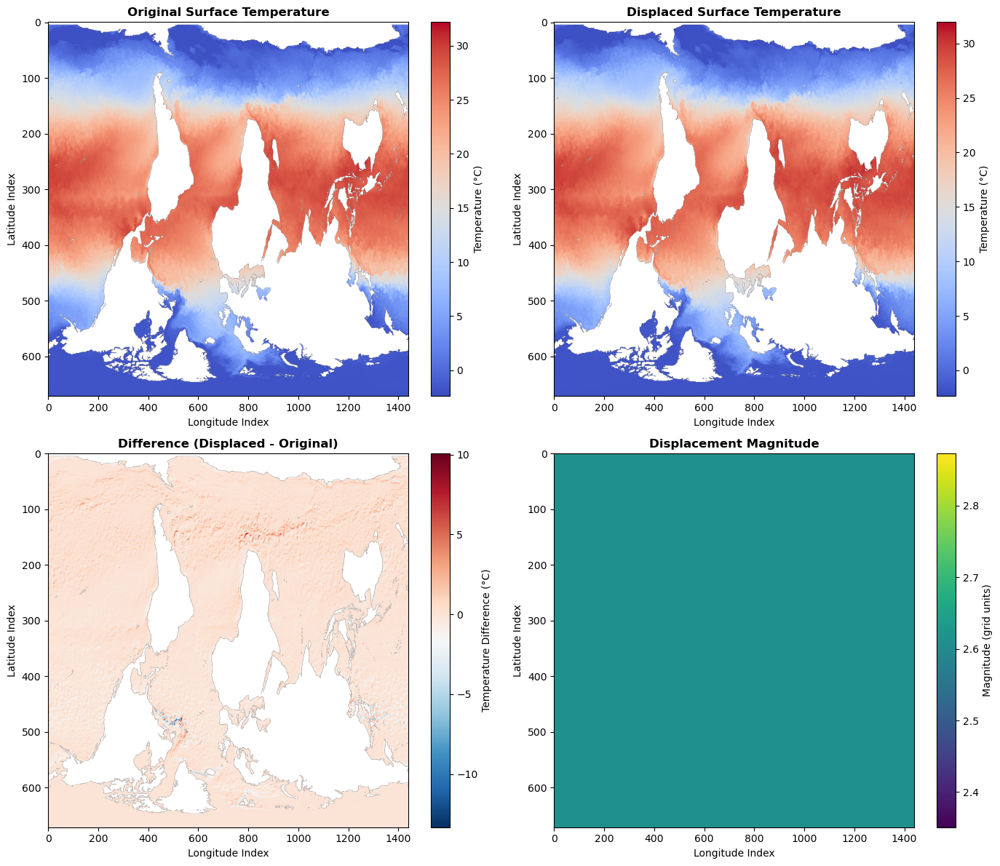


Visualization complete


In [12]:
import matplotlib.pyplot as plt

# Visualize the simple displacement
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

# Plot original
im0 = axes[0, 0].imshow(thetao_original, cmap='coolwarm', aspect='auto')
axes[0, 0].set_title('Original Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 0].set_xlabel('Longitude Index')
axes[0, 0].set_ylabel('Latitude Index')
plt.colorbar(im0, ax=axes[0, 0], label='Temperature (°C)')

# Plot displaced
im1 = axes[0, 1].imshow(thetao_displaced, cmap='coolwarm', aspect='auto')
axes[0, 1].set_title('Displaced Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 1].set_xlabel('Longitude Index')
axes[0, 1].set_ylabel('Latitude Index')
plt.colorbar(im1, ax=axes[0, 1], label='Temperature (°C)')

# Plot difference
difference = thetao_displaced - thetao_original
im2 = axes[1, 0].imshow(difference, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('Difference (Displaced - Original)', fontweight='bold', fontsize=12)
axes[1, 0].set_xlabel('Longitude Index')
axes[1, 0].set_ylabel('Latitude Index')
plt.colorbar(im2, ax=axes[1, 0], label='Temperature Difference (°C)')

# Plot displacement magnitude
displacement_magnitude = np.sqrt(dx_simple**2 + dy_simple**2)
im3 = axes[1, 1].imshow(displacement_magnitude, cmap='viridis', aspect='auto')
axes[1, 1].set_title('Displacement Magnitude', fontweight='bold', fontsize=12)
axes[1, 1].set_xlabel('Longitude Index')
axes[1, 1].set_ylabel('Latitude Index')
plt.colorbar(im3, ax=axes[1, 1], label='Magnitude (grid units)')

plt.tight_layout()
plt.show()

print("\nVisualization complete")

## Make perturbations for all channels ##

Simplified test is well performed. 
We can apply it for each depth level for every varables. </br> </br>

Before to do that, in order to get a wide variability of ensemble members, 
Let's make the stochasticity more reasonable and perturbation strategy more clear. </br>

1. Extract one $(u, v)$ pair and apply this vector for every ocean field.
    - Add Spatially correlated noise.
2. Use every $u$ and $v$ of surface grid point to make $dx$ and $dy$
    - Pointwise but apply same perturbation in vertical axis.
    - Stochasticity multiplicative for better spread. 

3. Same idea with number 2, but apply $(u, v)$ of depth level too. 
    - Completely pointwise



#### Fixed $u$ and $v$ ####

Extract meaningful $u$ and $v$ pairs from the physical field. </br>
Minimum and maximum currents values along depth level are choosen in this notebook. </br> 
**Only surface data will be used.**

In [13]:
# Create list of (u, v) combinations using min/max values across all depth levels
# For each depth: (min_u, min_v), (min_u, max_v), (max_u, min_v), (max_u, max_v)

uv_combinations_t0 = []
uv_combinations_t1 = []

for depth in range(1) : # range(21) : 
    # Process t0 (time = t-1)
    # Get min and max values for u and v at this depth level
    min_u = uv_depth_t0[f"min_d{depth}"].isel(ch=0).values  # u component
    max_u = uv_depth_t0[f"max_d{depth}"].isel(ch=0).values  # u component
    min_v = uv_depth_t0[f"min_d{depth}"].isel(ch=1).values  # v component
    max_v = uv_depth_t0[f"max_d{depth}"].isel(ch=1).values  # v component
    
    # Create 4 combinations for this depth level
    combinations_for_depth_t0 = [
        (min_u, min_v, depth, "min_u_min_v"),
        (max_u, min_v, depth, "max_u_min_v"),
        (min_u, max_v, depth, "min_u_max_v"),
        (max_u, max_v, depth, "max_u_max_v")
    ]

    # Process t1 (time = t)
    min_u_t1 = uv_depth_t1[f"min_d{depth}"].isel(ch=0).values  # u component
    max_u_t1 = uv_depth_t1[f"max_d{depth}"].isel(ch=0).values  # u component
    min_v_t1 = uv_depth_t1[f"min_d{depth}"].isel(ch=1).values  # v component
    max_v_t1 = uv_depth_t1[f"max_d{depth}"].isel(ch=1).values  # v component
    

    combinations_for_depth_t1 = [
        (min_u_t1, min_v_t1, depth, "min_u_min_v"),
        (max_u_t1, min_v_t1, depth, "max_u_min_v"),
        (min_u_t1, max_v_t1, depth, "min_u_max_v"),
        (max_u_t1, max_v_t1, depth, "max_u_max_v")
    ]
   
    uv_combinations_t0.extend(combinations_for_depth_t0)
    uv_combinations_t1.extend(combinations_for_depth_t1)
    
print(f"Total combinations created: {len(uv_combinations_t0)}")
print(f"Number of time points: 2")
print(f"Number of depth levels: 21")
print(f"Combinations per depth: 4")
print(f"\nFirst few combinations:")
for i in range(min(8, len(uv_combinations_t1))):
    u, v, d, label = uv_combinations_t1[i]
    print(f"  Depth {d}, {label}: u={u:.6f}, v={v:.6f}")

Total combinations created: 4
Number of time points: 2
Number of depth levels: 21
Combinations per depth: 4

First few combinations:
  Depth 0, min_u_min_v: u=-1.754814, v=-1.860408
  Depth 0, max_u_min_v: u=1.833552, v=-1.860408
  Depth 0, min_u_max_v: u=-1.754814, v=1.676077
  Depth 0, max_u_max_v: u=1.833552, v=1.676077


In order to apply $(u,v)$ to global scheme, we need to put $u$ and $v$ in every coordinate in target shape array. </br>
*This fixed one_vector $u$ and $v$ will be applied in every depth level.* 
There for only one 2D array is enough for each case. </br> </br>
Now, Let's add **randomness** after creating $u$ and $v$ field. </br>
See Spatial correalted noise using Gaussian filter and SSH anomaly dynamics[]

In [14]:
def create_correlation_length_field(shape, regions, default):
    """
    Create a field specifying correlation length at each location.
    
    Parameters:
    -----------
    shape : tuple
        Shape of the output field (ny, nx)
    regions : list of dict
        List of region specifications with correlation lengths
    default : background correlation length
    
    Returns:
    --------
    L_field : ndarray
        2D field with spatially-varying correlation length
    """
    ny, nx = shape
    L_field = np.ones((ny, nx)) * default  # Default correlation length
    
    y, x = np.mgrid[0:ny, 0:nx]
    
    for region in regions:
        mask = np.zeros((ny, nx))
        reg_type = region['type']
        correlation_length = region.get('correlation_length', 20.0)
        blend = region.get('blend', True)
        blend_width = region.get('blend_width', 30)
        
        if reg_type == 'box':
            coords = region['coords']
            y_min, y_max = coords['y_range']
            x_min, x_max = coords['x_range']
            
            if blend:
                from scipy.ndimage import distance_transform_edt
                box_mask = ((y >= y_min) & (y < y_max) & 
                           (x >= x_min) & (x < x_max)).astype(float)
                dist_inside = distance_transform_edt(box_mask)
                mask = np.minimum(1.0, dist_inside / blend_width)
            else:
                mask = ((y >= y_min) & (y < y_max) & 
                       (x >= x_min) & (x < x_max)).astype(float)
        
        elif reg_type == 'circle':
            coords = region['coords']
            cy, cx = coords['center']
            radius = coords['radius']
            dist = np.sqrt((y - cy)**2 + (x - cx)**2)
            
            if blend:
                mask = np.clip(1.0 - (dist - radius) / blend_width, 0, 1)
            else:
                mask = (dist <= radius).astype(float)
        
        elif reg_type == 'gradient':
            # Linear gradient from one edge to another
            coords = region['coords']
            direction = coords.get('direction', 'x')  # 'x' or 'y'
            L_start = coords.get('L_start', 10.0)
            L_end = coords.get('L_end', 100.0)
            
            if direction == 'x':
                gradient = np.linspace(L_start, L_end, nx)
                L_field = np.tile(gradient, (ny, 1))
            else:  # 'y'
                gradient = np.linspace(L_start, L_end, ny)
                L_field = np.tile(gradient[:, np.newaxis], (1, nx))
            continue  # Don't blend with mask
        
        # Blend this region's correlation length with existing field
        L_field = L_field * (1 - mask) + correlation_length * mask
    
    return L_field


def spatially_varying_gaussian_filter(shape, correlation_length_field, amplitude=1.0, seed=None):
    """
    Generate correlated noise with spatially-varying correlation length.
    Uses a multi-scale approach: generates noise at different scales and blends them.
    
    Parameters:
    -----------
    shape : tuple
        Shape of the output noise field (ny, nx)
    correlation_length_field : ndarray
        2D field specifying correlation length at each location
    amplitude : float
        Standard deviation of the output noise field
    seed : int or None
        Random seed for reproducibility
    
    Returns:
    --------
    correlated_noise : ndarray
        Noise field with spatially-varying correlation structure
    """
    from scipy.ndimage import gaussian_filter
    
    ny, nx = shape
    
    # Get the range of correlation lengths (ignoring NaN)
    L_min = np.nanmin(correlation_length_field)
    L_max = np.nanmax(correlation_length_field)
    
    # Create a set of base scales (logarithmically spaced)
    n_scales = 5
    L_scales = np.logspace(np.log10(max(L_min, 1)), np.log10(L_max), n_scales)
    
    # Generate ONE white noise field and filter it at different scales
    # This ensures reproducibility with the seed parameter
    if seed is not None :
        rng = np.random.RandomState(seed)
        white_noise = rng.randn(ny, nx)
    else :
        white_noise = np.random.randn(ny, nx)
    
    noise_scales = []
    for L in L_scales:
        filtered = gaussian_filter(white_noise, sigma=L)
        noise_scales.append(filtered)
    
    # Blend the different scales based on local correlation length
    output = np.zeros((ny, nx))
    
    for i, L in enumerate(L_scales):
        # Weight function: higher weight where correlation_length_field matches this scale
        # Using Gaussian weighting in log-space
        log_L = np.log(L)
        log_L_field = np.log(np.maximum(correlation_length_field, 1e-6))
        
        # Weight peaks at scales matching the local correlation length
        weight = np.exp(-((log_L_field - log_L)**2) / (2 * 0.5**2))
        
        output += weight * noise_scales[i]
    
    # Normalize weights (divide by sum of weights at each location)
    total_weight = np.zeros((ny, nx))
    for i, L in enumerate(L_scales):
        log_L = np.log(L)
        log_L_field = np.log(np.maximum(correlation_length_field, 1e-6))
        weight = np.exp(-((log_L_field - log_L)**2) / (2 * 0.5**2))
        total_weight += weight
    
    output = output / (total_weight + 1e-10)
    
    # Restore NaN where correlation_length_field was NaN
    output = np.where(np.isnan(correlation_length_field), np.nan, output)
    
    # Normalize to desired amplitude (only using valid values)
    output = output / np.nanstd(output) * amplitude / 10
    
    return output


In [15]:
climato = xr.open_dataset("/Odyssey/public/glonet/1993-06-01_climatology/mean1.nc")
rand_ds = xr.open_dataset("/Odyssey/public/glonet/2022-06-01_init_states/input1.nc")
anomaly_ssh = climato.isel(time=0, ch=0)['data'] - rand_ds.isel(time=0, ch=0)['data']

In [16]:
# Get dimensions from anomaly_ssh - note xarray dimensions are (lat, lon)
ny, nx = anomaly_ssh.shape
print(f"Data shape: {anomaly_ssh.shape}, dims: {anomaly_ssh.dims}")

# Define the 4 ocean boxes with CORRECTED geographic coordinates
ocean_regions = [
    # Gulf Stream (North Atlantic: 30-45°N, 80-50°W)
    {'name': 'Gulf Stream',
     'type': 'box', 
     'correlation_length': 4.0,  # Large mesoscale eddies
     'coords': {'y_range': [382, 542], 
                'x_range': [300, 620]},
     'blend': True, 
     'blend_width': 70},
    
    # Kuroshio (North Pacific: 30-45°N, 135-160°E)
    {'name': 'Kuroshio',
     'type': 'box', 
     'correlation_length': 4.0,  # Large western boundary current eddies
     'coords': {'y_range': [382, 542], 
                'x_range': [1160, 1460]},
     'blend': True, 
     'blend_width': 70},
    
    # Agulhas Current (South Indian Ocean: 45-30°S, 15-40°E)
    {'name': 'Agulhas',
     'type': 'box', 
     'correlation_length': 4.0,  # Strong retroflection eddies
     'coords': {'y_range': [82, 242], 
                'x_range': [680, 980]},
     'blend': True, 
     'blend_width': 70},
    
    # Antarctic Circumpolar Current (60-45°S, circumpolar)
    {'name': 'Antarctic ACC',
     'type': 'box', 
     'correlation_length': 10.0,  # Strong ACC dynamics
     'coords': {'y_range': [80, 162], 
                'x_range': [0, nx]},  # Circumpolar band
     'blend': True, 
     'blend_width': 30},
]


Data shape: (672, 1440), dims: ('lat', 'lon')


In [17]:
# Create 2D displacement fields with randomness for each UV combination
# Shape will match the data grid (lat, lon)

import numpy as np

# Get the grid shape from the data
grid_shape = u_surface.shape  # (lat, lon)
print(f"Grid shape: {grid_shape}")

# Parameters for adding randomness
lambda_noise = 0.05  # Scale factor for stochastic noise (5% of the current value)
dt = 1.0  # Time scaling factor

# Create displacement fields for each combination
displacement_fields_t0 = []
displacement_fields_t1 = []

# Process t0 (time = t-1)
for idx, (u_val, v_val, depth, label) in enumerate(uv_combinations_t0):
    # Create 2D arrays filled with the u and v values
    u_2d = np.full(grid_shape, u_val, dtype=np.float32)
    v_2d = np.full(grid_shape, v_val, dtype=np.float32)

    # Add Gaussian random noise
    # rng = np.random.default_rng(seed=42 + idx)  # Different seed for each combination
    
    # std_u = lambda_noise * np.abs(u_val)
    # std_v = lambda_noise * np.abs(v_val)
    
    # epsilon_u = rng.normal(loc=0.0, scale=std_u, size=grid_shape)
    # epsilon_v = rng.normal(loc=0.0, scale=std_v, size=grid_shape)

    # Create the correlation length field with these regions
    L_field_regions = create_correlation_length_field((ny, nx), ocean_regions, 50)

    # Create amplitude field based on SSH anomaly magnitude
    # Higher SSH variability = higher perturbation amplitude
    ssh_std = float(np.nanstd(anomaly_ssh.values))
    amp_field_regions = (np.abs(anomaly_ssh.values)) / ssh_std   # Scale to reasonable amplitude

    # Generate spatially-varying noise
    regional_noise = spatially_varying_gaussian_filter((ny, nx), L_field_regions, amplitude=0.1, seed=100)
    
    # Scale by amplitude field (based on SSH anomaly)
    regional_noise_scaled = regional_noise * amp_field_regions
      
    # Calculate displacements: dx = dt * (u + epsilon_u), dy = dt * (v + epsilon_v)
    dx = dt * (u_2d + regional_noise_scaled)
    dy = dt * (v_2d + regional_noise_scaled)
    
    # Store the displacement field
    displacement_fields_t0.append({
        'dx': dx,
        'dy': dy,
        'depth': depth,
        'label': label,
        'u_base': u_val,
        'v_base': v_val,
        'combination_idx': idx
    })

# Process t1 (time = t)
for idx, (u_val, v_val, depth, label) in enumerate(uv_combinations_t1):
    # Create 2D arrays filled with the u and v values
    u_2d = np.full(grid_shape, u_val, dtype=np.float32)
    v_2d = np.full(grid_shape, v_val, dtype=np.float32)
    
    # Add Gaussian random noise
    # rng = np.random.default_rng(seed=42 + idx)  # Different seed for each combination
    
    # std_u = lambda_noise * np.abs(u_val)
    # std_v = lambda_noise * np.abs(v_val)
    
    # epsilon_u = rng.normal(loc=0.0, scale=std_u, size=grid_shape)
    # epsilon_v = rng.normal(loc=0.0, scale=std_v, size=grid_shape)
    
    # Create the correlation length field with these regions
    L_field_regions = create_correlation_length_field((ny, nx), ocean_regions, 50)

    # Create amplitude field based on SSH anomaly magnitude
    # Higher SSH variability = higher perturbation amplitude
    ssh_std = float(np.nanstd(anomaly_ssh.values))
    amp_field_regions = (np.abs(anomaly_ssh.values)) / ssh_std   # Scale to reasonable amplitude

    # Generate spatially-varying noise
    regional_noise = spatially_varying_gaussian_filter((ny, nx), L_field_regions, amplitude=0.1, seed=101)

    # Scale by amplitude field (based on SSH anomaly)
    regional_noise_scaled = regional_noise * amp_field_regions    
    # Calculate displacements: dx = dt * (u + epsilon_u), dy = dt * (v + epsilon_v)
    
    dx = dt * (u_2d + regional_noise_scaled)
    dy = dt * (v_2d + regional_noise_scaled)
    
    # Store the displacement field
    displacement_fields_t1.append({
        'dx': dx,
        'dy': dy,
        'depth': depth,
        'label': label,
        'u_base': u_val,
        'v_base': v_val,
        'combination_idx': idx
    })

print(f"\nCreated {len(displacement_fields_t0)} displacement fields for t0")
print(f"Each field has shape: {displacement_fields_t0[0]['dx'].shape}")
print(f"\nExample displacement field (first combination) for t0:")
print(f"  Label: {displacement_fields_t0[0]['label']}, Depth: {displacement_fields_t0[0]['depth']}")
print(f"  Base u: {displacement_fields_t0[0]['u_base']:.6f}, Base v: {displacement_fields_t0[0]['v_base']:.6f}")
print(f"  dx range: [{np.nanmin(displacement_fields_t0[0]['dx']):.6f}, {np.nanmax(displacement_fields_t0[0]['dx']):.6f}]")
print(f"  dy range: [{np.nanmin(displacement_fields_t0[0]['dy']):.6f}, {np.nanmax(displacement_fields_t0[0]['dy']):.6f}]")
print(f"\nCreated for both t-1, and t time displacement fields.")

Grid shape: (672, 1440)

Created 4 displacement fields for t0
Each field has shape: (672, 1440)

Example displacement field (first combination) for t0:
  Label: min_u_min_v, Depth: 0
  Base u: -2.054506, Base v: -1.915342
  dx range: [-2.835011, -1.378767]
  dy range: [-2.695847, -1.239602]

Created for both t-1, and t time displacement fields.


#### pointwise current displacement ####

We can make pointwise current displacement for depth level field. </br>
This field is already collected at the first step on this notebook. </br>
Let's make another displacement field `list[dict]` like as the case above.
In this case, the list contains 3D displacements.  

In [18]:
def spectral_correlated_noise(shape, correlation_length, amplitude=1.0, spectral_slope=-3, seed=None):
    """
    Generate spatially correlated noise using spectral method (more physical for ocean/eddies).
    
    Parameters:
    -----------
    shape : tuple
        Shape of the output noise field (ny, nx)
    correlation_length : float
        Correlation length scale in grid points
    amplitude : float
        Standard deviation of the output noise field
    spectral_slope : float
        Spectral slope (default -3 for turbulent flow, -5/3 for inertial range)
    seed : int or None
        Random seed for reproducibility
    
    Returns:
    --------
    correlated_noise : ndarray
        Spatially correlated noise field with realistic spectral characteristics
    """
    ny, nx = shape[:2]
    
    # Create frequency grid
    kx = np.fft.fftfreq(nx, d=1.0)
    ky = np.fft.fftfreq(ny, d=1.0)
    KX, KY = np.meshgrid(kx, ky)
    K = np.sqrt(KX**2 + KY**2)
    K[0, 0] = 1.0  # Avoid division by zero
    
    # Generate white noise in spectral space
    if seed is not None:
        rng = np.random.RandomState(seed)
        white_spectrum = np.fft.fft2(rng.randn(ny, nx))
    else:
        white_spectrum = np.fft.fft2(np.random.randn(ny, nx))
    
    # Apply power law spectrum filter
    # E(k) ~ k^spectral_slope with exponential cutoff at correlation scale
    k0 = 1.0 / correlation_length
    spectral_filter = K**spectral_slope * np.exp(-K / k0)
    spectral_filter[0, 0] = 0  # Remove mean
    
    # Apply filter in spectral space
    filtered_spectrum = white_spectrum * spectral_filter
    
    # Transform back to physical space
    correlated_noise = np.real(np.fft.ifft2(filtered_spectrum))
    
    # Normalize to desired amplitude
    correlated_noise = correlated_noise / np.std(correlated_noise) * amplitude
    
    # Make noise positive and map to [0, 1]
    correlated_noise_positive = np.exp(correlated_noise)
    adjust_factor = (4+ spectral_slope) + 1e-6  # Prevent division by zero
    correlated_noise_positive_normalized = correlated_noise_positive / adjust_factor # / correlated_noise_positive.mean()
    
    return correlated_noise_positive_normalized

In [19]:
# Create displacement fields using complete u and v fields from each depth level
# Each depth level will have its own displacement field
# Using MULTIPLICATIVE randomness for larger perturbations

import numpy as np

# Parameters for adding randomness
lambda_noise = 0.05  # Scale factor for stochastic noise (5% multiplicative)
dt = 1.0  # Time scaling factor

# Create pointwise displacement fields for each depth level
pointwise_displacement_fields_t0 = []
pointwise_displacement_fields_t1 = []

# Process t0 (time = t-1)
# Generate spatially correlated multiplicative noise
correlation_length = 10  # grid points
amplitude = 0.3
k = np.random.normal(loc=-1.0, scale=0.3)
noise_spectral_u_t0 = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=42)
noise_spectral_v_t0 = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=43)
    
for depth in range(21):
    # Extract u and v fields for this depth level
    uv_data = uv_depth_t0[f"d{depth}"]  # Shape: (ch=2, lat, lon)
    u_field = uv_data.isel(ch=0).values  # u component
    v_field = uv_data.isel(ch=1).values  # v component
    
    # # Add MULTIPLICATIVE Gaussian random noise to each grid point
    # rng = np.random.default_rng(seed=100 + depth)  # Different seed for each depth
    
    # # Generate multiplicative noise: (1 + lambda * N(0,1))
    # # This scales the original field by a factor around 1.0
    # epsilon_u = 1.0 + lambda_noise * rng.normal(loc=0.0, scale=1.0, size=u_field.shape)
    # epsilon_v = 1.0 + lambda_noise * rng.normal(loc=0.0, scale=1.0, size=v_field.shape)

    # Calculate displacements with multiplicative noise: dx = dt * u * epsilon_u
    dx = dt * u_field * noise_spectral_u_t0
    dy = dt * v_field * noise_spectral_v_t0
    
    # Store the displacement field
    pointwise_displacement_fields_t0.append({
        'dx': dx,
        'dy': dy,
        'depth': depth,
        'label': f'pointwise_d{depth}',
        'u_field_mean': np.nanmean(u_field),
        'v_field_mean': np.nanmean(v_field),
        'u_field_std': np.nanstd(u_field),
        'v_field_std': np.nanstd(v_field),
        'noise_type': 'multiplicative'
    })

# Process t1 (time = t)
# Generate spatially correlated multiplicative noise
noise_spectral_u_t1 = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=44)
noise_spectral_v_t1 = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=45)

for depth in range(21):
    # Extract u and v fields for this depth level
    uv_data = uv_depth_t1[f"d{depth}"]  # Shape: (ch=2, lat, lon)
    u_field = uv_data.isel(ch=0).values  # u component
    v_field = uv_data.isel(ch=1).values  # v component
    
    # # Add MULTIPLICATIVE Gaussian random noise to each grid point
    # rng = np.random.default_rng(seed=100 + depth)  # Same seed pattern for consistency
    
    # # Generate multiplicative noise: (1 + lambda * N(0,1))
    # epsilon_u = 1.0 + lambda_noise * rng.normal(loc=0.0, scale=1.0, size=u_field.shape)
    # epsilon_v = 1.0 + lambda_noise * rng.normal(loc=0.0, scale=1.0, size=v_field.shape)
    
    # Calculate displacements with multiplicative noise: dx = dt * u * epsilon_u
    dx = dt * u_field * noise_spectral_u_t1
    dy = dt * v_field * noise_spectral_v_t1
    
    # Store the displacement field
    pointwise_displacement_fields_t1.append({
        'dx': dx,
        'dy': dy,
        'depth': depth,
        'label': f'pointwise_d{depth}',
        'u_field_mean': np.nanmean(u_field),
        'v_field_mean': np.nanmean(v_field),
        'u_field_std': np.nanstd(u_field),
        'v_field_std': np.nanstd(v_field),
        'noise_type': 'multiplicative'
    })

print(f"Created {len(pointwise_displacement_fields_t0)} pointwise displacement fields for t0")
print(f"Created {len(pointwise_displacement_fields_t1)} pointwise displacement fields for t1")
print(f"Each field has shape: {pointwise_displacement_fields_t0[0]['dx'].shape}")
print(f"Noise type: MULTIPLICATIVE (scales with current magnitude)")

print(f"\n k for t0 and t1: {k:.3f}")

print(f"\nExample statistics for depth 0 (surface) at t0:")
example = pointwise_displacement_fields_t0[0]
print(f"  Label: {example['label']}")
print(f"  Noise type: {example['noise_type']}")
print(f"  Mean u field: {example['u_field_mean']:.6f}, Std u field: {example['u_field_std']:.6f}")
print(f"  Mean v field: {example['v_field_mean']:.6f}, Std v field: {example['v_field_std']:.6f}")
print(f"  dx range: [{np.nanmin(example['dx']):.6f}, {np.nanmax(example['dx']):.6f}]")
print(f"  dy range: [{np.nanmin(example['dy']):.6f}, {np.nanmax(example['dy']):.6f}]")


print(f"\nExample statistics for depth 10 at t1:")
example = pointwise_displacement_fields_t1[10]
print(f"  Label: {example['label']}")
print(f"  Noise type: {example['noise_type']}")
print(f"  Mean u field: {example['u_field_mean']:.6f}, Std u field: {example['u_field_std']:.6f}")
print(f"  Mean v field: {example['v_field_mean']:.6f}, Std v field: {example['v_field_std']:.6f}")
print(f"  dx range: [{np.nanmin(example['dx']):.6f}, {np.nanmax(example['dx']):.6f}]")
print(f"  dy range: [{np.nanmin(example['dy']):.6f}, {np.nanmax(example['dy']):.6f}]")

Created 21 pointwise displacement fields for t0
Created 21 pointwise displacement fields for t1
Each field has shape: (672, 1440)
Noise type: MULTIPLICATIVE (scales with current magnitude)

 k for t0 and t1: -0.763

Example statistics for depth 0 (surface) at t0:
  Label: pointwise_d0
  Noise type: multiplicative
  Mean u field: 0.005318, Std u field: 0.180777
  Mean v field: 0.008648, Std v field: 0.148803
  dx range: [-1.003316, 0.957272]
  dy range: [-0.876686, 0.850100]

Example statistics for depth 10 at t1:
  Label: pointwise_d10
  Noise type: multiplicative
  Mean u field: 0.005294, Std u field: 0.134063
  Mean v field: -0.000218, Std v field: 0.068357
  dx range: [-1.020756, 0.841161]
  dy range: [-0.365978, 0.300263]


#### Make displaced field ####

Don't forget we have two type of displacement field : fixed $(u, v)$ and 3D $(u, v)$. </br>
First, need to get every landmask for each depth level. </br>
**For each channel**, (for each variable and each depth), 
apply appropriate land amsk and u and v fields to make displacement.

In [20]:
# Create displaced fields using the displacement fields we created
# We'll use the simple_displacement function and create land masks for each depth level

import numpy as np
from scipy.ndimage import map_coordinates

# First, let's create land masks for all depth levels
# We'll use SSH (channel 0) for surface, and temperature channels for depth levels

print("Creating land masks for all depth levels...")
land_masks_t0 = {}
land_masks_t1 = {}

# Surface land mask (use SSH - channel 0)
land_masks_t0['d0'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t0, ch=0))
land_masks_t1['d0'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t1, ch=0))

# Depth level masks (use temperature channels)
for depth in range(1, 11):  # Depth levels 1-10
    temp_ch = 24 + depth  # Temperature channels for depth levels 1-10
    land_masks_t0[f'd{depth}'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t0, ch=temp_ch))
    land_masks_t1[f'd{depth}'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t1, ch=temp_ch))

for depth in range(11, 21):  # Depth levels 11-20
    temp_ch = 54 + depth  # Temperature channels for depth levels 11-20
    land_masks_t0[f'd{depth}'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t0, ch=temp_ch))
    land_masks_t1[f'd{depth}'] = create_land_mask_from_channel(ds["data"].isel(time=sample_idx_t1, ch=temp_ch))

print(f"Created land masks for {len(land_masks_t0)} depth levels")
print(f"Example: Surface ocean points = {(~land_masks_t0['d0']).sum().values}")

Creating land masks for all depth levels...
Created land masks for 21 depth levels
Example: Surface ocean points = 676595


In [21]:
# Function to apply displacement to all channels at a given depth level
def displace_all_channels_at_depth(ds_data, time_idx, depth, dx, dy, land_mask):
    """
    Apply displacement to all channels at a given depth level
    Returns a dictionary with displaced data for each channel
    """
    displaced_channels = {}
    
    # Determine which channels belong to this depth level
    if depth == 0:
        # Surface: SSH (0), T (1), S (2), u (3), v (4)
        channels = [0, 1, 2, 3, 4]
        channel_names = ['ssh', 'thetao', 'so', 'uo', 'vo']
    elif 1 <= depth <= 10:
        # Depth 1-10: T, S, u, v
        base_t = 5 + depth - 1
        base_s = base_t + 10
        base_u = base_s + 10
        base_v = base_u + 10
        channels = [base_t, base_s, base_u, base_v]
        channel_names = ['thetao', 'so', 'uo', 'vo']
    else:  # 11 <= depth <= 20
        # Depth 11-20: T, S, u, v
        base_t = 35 + depth - 1
        base_s = base_t + 10
        base_u = base_s + 10
        base_v = base_u + 10
        channels = [base_t, base_s, base_u, base_v]
        channel_names = ['thetao', 'so', 'uo', 'vo']
    
    # Apply displacement to each channel
    for ch, ch_name in zip(channels, channel_names):
        original_data = ds_data.isel(time=time_idx, ch=ch).values
        displaced_data = simple_displacement(original_data, dx, dy, land_mask)
        displaced_channels[f'ch{ch}_{ch_name}'] = displaced_data
    
    return displaced_channels, channels, channel_names

In [22]:
# Now let's create displaced fields using one_vector displacement fields
# For one_vector fields, we apply the same (u, v) displacement to ALL depth levels

print("Creating ensemble members using one_vector displacement fields...")
print("="*70)

# Store all ensemble members for one_vector displacements
one_vector_ensemble_members_t0 = []
one_vector_ensemble_members_t1 = []

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for idx, disp_field in enumerate(displacement_fields_t0):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    
    # For one_vector displacement, we apply to ALL channels across ALL depth levels
    all_displaced_channels = {}
    all_channels = []
    all_channel_names = []
    
    # Process all 21 depth levels
    for d in range(21):
        # Get the appropriate land mask for this depth
        land_mask = land_masks_t0[f'd{d}']
        
        # Apply displacement to all channels at this depth
        displaced_channels, channels, channel_names = displace_all_channels_at_depth(
            ds["data"], sample_idx_t0, d, dx, dy, land_mask
        )
        
        # Store with depth prefix to avoid key conflicts
        for key, value in displaced_channels.items():
            all_displaced_channels[f'd{d}_{key}'] = value
        
        all_channels.extend(channels)
        all_channel_names.extend([f'd{d}_{name}' for name in channel_names])
    
    # Store the ensemble member
    ensemble_member = {
        'depth_source': depth,  # Which depth level the (u,v) came from
        'label': label,
        'time_idx': sample_idx_t0,
        'displacement_type': 'one_vector',
        'u_base': disp_field['u_base'],
        'v_base': disp_field['v_base'],
        'displaced_channels': all_displaced_channels,
        'channel_indices': all_channels,
        'channel_names': all_channel_names
    }
    one_vector_ensemble_members_t0.append(ensemble_member)
    
    if idx % 20 == 0:  # Print progress every 20 combinations
        print(f"  Processed combination {idx}/{len(displacement_fields_t0)}: {label} from depth {depth}")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for idx, disp_field in enumerate(displacement_fields_t1):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    
    # For one_vector displacement, we apply to ALL channels across ALL depth levels
    all_displaced_channels = {}
    all_channels = []
    all_channel_names = []
    
    # Process all 21 depth levels
    for d in range(21):
        # Get the appropriate land mask for this depth
        land_mask = land_masks_t1[f'd{d}']
        
        # Apply displacement to all channels at this depth
        displaced_channels, channels, channel_names = displace_all_channels_at_depth(
            ds["data"], sample_idx_t1, d, dx, dy, land_mask
        )
        
        # Store with depth prefix to avoid key conflicts
        for key, value in displaced_channels.items():
            all_displaced_channels[f'd{d}_{key}'] = value
        
        all_channels.extend(channels)
        all_channel_names.extend([f'd{d}_{name}' for name in channel_names])
    
    # Store the ensemble member
    ensemble_member = {
        'depth_source': depth,  # Which depth level the (u,v) came from
        'label': label,
        'time_idx': sample_idx_t1,
        'displacement_type': 'one_vector',
        'u_base': disp_field['u_base'],
        'v_base': disp_field['v_base'],
        'displaced_channels': all_displaced_channels,
        'channel_indices': all_channels,
        'channel_names': all_channel_names
    }
    one_vector_ensemble_members_t1.append(ensemble_member)
    
    if idx % 20 == 0:  # Print progress every 20 combinations
        print(f"  Processed combination {idx}/{len(displacement_fields_t1)}: {label} from depth {depth}")

print(f"\n{'='*70}")
print(f"Created {len(one_vector_ensemble_members_t0)} one_vector ensemble members for t0")
print(f"Created {len(one_vector_ensemble_members_t1)} one_vector ensemble members for t1")
print(f"\nExample one_vector ensemble member (first combination, t0):")
example = one_vector_ensemble_members_t0[0]
print(f"  Label: {example['label']}")
print(f"  Depth source: {example['depth_source']}")
print(f"  Base u: {example['u_base']:.6f}, Base v: {example['v_base']:.6f}")
print(f"  Total channels displaced: {len(example['channel_indices'])}")
print(f"  Displacement type: {example['displacement_type']}")


Creating ensemble members using one_vector displacement fields...

Processing t0 (time=0):
  Processed combination 0/4: min_u_min_v from depth 0

Processing t1 (time=1):
  Processed combination 0/4: min_u_min_v from depth 0

Created 4 one_vector ensemble members for t0
Created 4 one_vector ensemble members for t1

Example one_vector ensemble member (first combination, t0):
  Label: min_u_min_v
  Depth source: 0
  Base u: -2.054506, Base v: -1.915342
  Total channels displaced: 85
  Displacement type: one_vector


In [23]:
# Now let's create displaced fields using pointwise displacement fields
# We'll create ensemble members for both t0 and t1

print("Creating ensemble members using pointwise displacement fields...")
print("="*70)

# Store all ensemble members
pointwise_ensemble_members_t0 = []
pointwise_ensemble_members_t1 = []

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for depth_idx, disp_field in enumerate(pointwise_displacement_fields_t0):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    
    # Get the appropriate land mask
    land_mask = land_masks_t0[f'd{depth}']
       
    # Apply displacement to all channels at this depth
    displaced_channels, channels, channel_names = displace_all_channels_at_depth(
        ds["data"], sample_idx_t0, depth, dx, dy, land_mask
    )

    # Store the ensemble member
    ensemble_member = {
        'depth': depth,
        'label': label,
        'time_idx': sample_idx_t0,
        'displacement_dx_mean': np.nanmean(dx),
        'displacement_dy_mean': np.nanmean(dy),
        'displaced_channels': displaced_channels,
        'channel_indices': channels,
        'channel_names': channel_names
    }
    pointwise_ensemble_members_t0.append(ensemble_member)
    
    if depth_idx % 5 == 0:  # Print progress every 5 depth levels
        print(f"  Processed depth {depth}: {len(channel_names)} channels displaced")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for depth_idx, disp_field in enumerate(pointwise_displacement_fields_t1):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    
    # Get the appropriate land mask
    land_mask = land_masks_t1[f'd{depth}']
    
    # Apply displacement to all channels at this depth
    displaced_channels, channels, channel_names = displace_all_channels_at_depth(
        ds["data"], sample_idx_t1, depth, dx, dy, land_mask
    )
        
    # Store the ensemble member
    ensemble_member = {
        'depth': depth,
        'label': label,
        'time_idx': sample_idx_t1,
        'displacement_dx_mean': np.nanmean(dx),
        'displacement_dy_mean': np.nanmean(dy),
        'displaced_channels': displaced_channels,
        'channel_indices': channels,
        'channel_names': channel_names
    }
    pointwise_ensemble_members_t1.append(ensemble_member)
    
    if depth_idx % 5 == 0:  # Print progress every 5 depth levels
        print(f"  Processed depth {depth}: {len(channel_names)} channels displaced")

print(f"\n{'='*70}")
print(f"Created {len(pointwise_ensemble_members_t0)} ensemble members for t0")
print(f"Created {len(pointwise_ensemble_members_t1)} ensemble members for t1")
print(f"\nExample ensemble member (depth 0, t0):")
example = pointwise_ensemble_members_t0[0]
print(f"  Label: {example['label']}")
print(f"  Depth: {example['depth']}")
print(f"  Channels displaced: {example['channel_names']}")
print(f"  Mean dx: {example['displacement_dx_mean']:.6f}")
print(f"  Mean dy: {example['displacement_dy_mean']:.6f}")


Creating ensemble members using pointwise displacement fields...

Processing t0 (time=0):
  Processed depth 0: 5 channels displaced
  Processed depth 5: 4 channels displaced
  Processed depth 10: 4 channels displaced
  Processed depth 15: 4 channels displaced
  Processed depth 20: 4 channels displaced

Processing t1 (time=1):
  Processed depth 0: 5 channels displaced
  Processed depth 5: 4 channels displaced
  Processed depth 10: 4 channels displaced
  Processed depth 15: 4 channels displaced
  Processed depth 20: 4 channels displaced

Created 21 ensemble members for t0
Created 21 ensemble members for t1

Example ensemble member (depth 0, t0):
  Label: pointwise_d0
  Depth: 0
  Channels displaced: ['ssh', 'thetao', 'so', 'uo', 'vo']
  Mean dx: 0.001968
  Mean dy: -0.002209


---
---
### Visualization of displacement ###

Visualizing one_vector displacement example: Surface temperature (depth 0, t0)


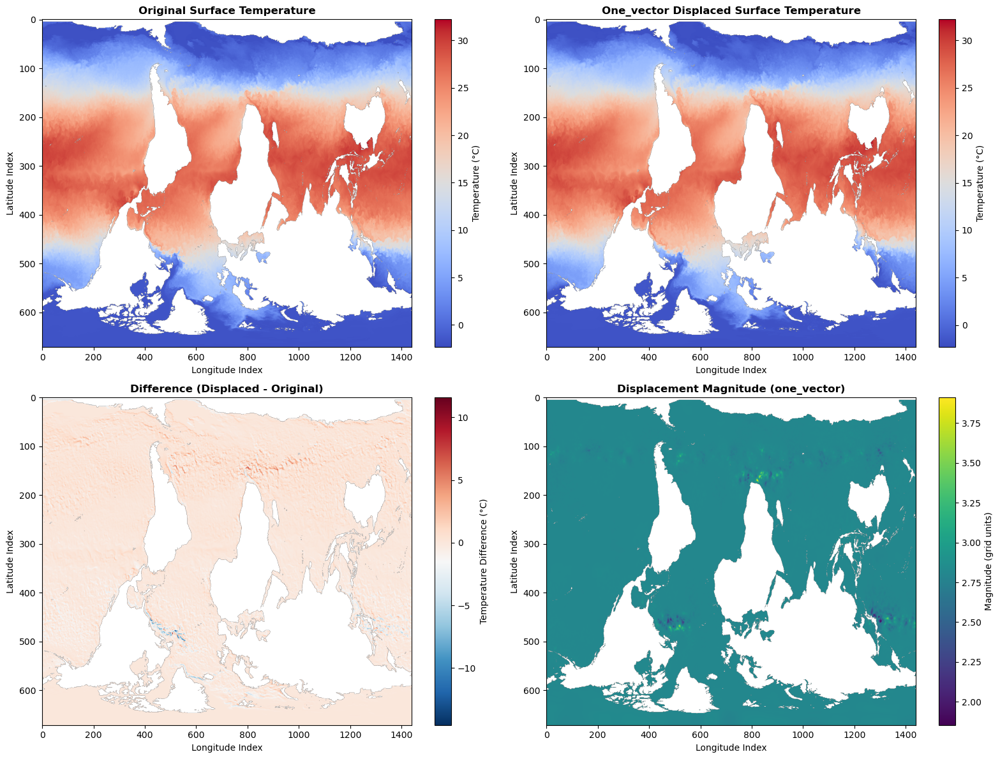


Statistics for one_vector surface temperature displacement:
Base u: -2.054506, Base v: -1.915342
Label: min_u_min_v, Depth source: 0
Original - mean: 13.636185, std: 11.398827
Displaced - mean: 13.678870, std: 11.394428
Difference - mean: 0.042685, std: 0.635420
Difference - max abs: 14.550637


In [24]:
# Let's visualize one_vector displacement example: compare original vs displaced for surface temperature at depth 0
print("Visualizing one_vector displacement example: Surface temperature (depth 0, t0)")

# Get original and one_vector displaced data
depth_to_plot = 0
original_data = ds["data"].isel(time=sample_idx_t0, ch=1).values  # Channel 1 is surface temperature
one_vector_example = one_vector_ensemble_members_t0[0]
one_vector_displaced_data = one_vector_example['displaced_channels']['d0_ch1_thetao']

# Get displacement field info for one_vector (first combination)
disp_field = displacement_fields_t0[0]
dx = disp_field['dx']
dy = disp_field['dy']

# Calculate difference
difference = one_vector_displaced_data - original_data
displacement_magnitude = np.sqrt(dx**2 + dy**2)

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot original
im0 = axes[0, 0].imshow(original_data, cmap='coolwarm', aspect='auto')
axes[0, 0].set_title('Original Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 0].set_xlabel('Longitude Index')
axes[0, 0].set_ylabel('Latitude Index')
plt.colorbar(im0, ax=axes[0, 0], label='Temperature (°C)')

# Plot displaced
im1 = axes[0, 1].imshow(one_vector_displaced_data, cmap='coolwarm', aspect='auto')
axes[0, 1].set_title('One_vector Displaced Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 1].set_xlabel('Longitude Index')
axes[0, 1].set_ylabel('Latitude Index')
plt.colorbar(im1, ax=axes[0, 1], label='Temperature (°C)')

# Plot difference
im2 = axes[1, 0].imshow(difference, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('Difference (Displaced - Original)', fontweight='bold', fontsize=12)
axes[1, 0].set_xlabel('Longitude Index')
axes[1, 0].set_ylabel('Latitude Index')
plt.colorbar(im2, ax=axes[1, 0], label='Temperature Difference (°C)')

# Plot displacement magnitude
im3 = axes[1, 1].imshow(displacement_magnitude, cmap='viridis', aspect='auto')
axes[1, 1].set_title('Displacement Magnitude (one_vector)', fontweight='bold', fontsize=12)
axes[1, 1].set_xlabel('Longitude Index')
axes[1, 1].set_ylabel('Latitude Index')
plt.colorbar(im3, ax=axes[1, 1], label='Magnitude (grid units)')

plt.tight_layout()
plt.show()

# Print statistics
ocean_mask = ~land_masks_t0['d0'].values
orig_ocean = original_data[ocean_mask]
disp_ocean = one_vector_displaced_data[ocean_mask]
diff_ocean = difference[ocean_mask]

print("\nStatistics for one_vector surface temperature displacement:")
print("="*60)
print(f"Base u: {one_vector_example['u_base']:.6f}, Base v: {one_vector_example['v_base']:.6f}")
print(f"Label: {one_vector_example['label']}, Depth source: {one_vector_example['depth_source']}")
print(f"Original - mean: {np.nanmean(orig_ocean):.6f}, std: {np.nanstd(orig_ocean):.6f}")
print(f"Displaced - mean: {np.nanmean(disp_ocean):.6f}, std: {np.nanstd(disp_ocean):.6f}")
print(f"Difference - mean: {np.nanmean(diff_ocean):.6f}, std: {np.nanstd(diff_ocean):.6f}")
print(f"Difference - max abs: {np.nanmax(np.abs(diff_ocean)):.6f}")

Visualizing displacement example: Surface temperature (depth 0, t0)


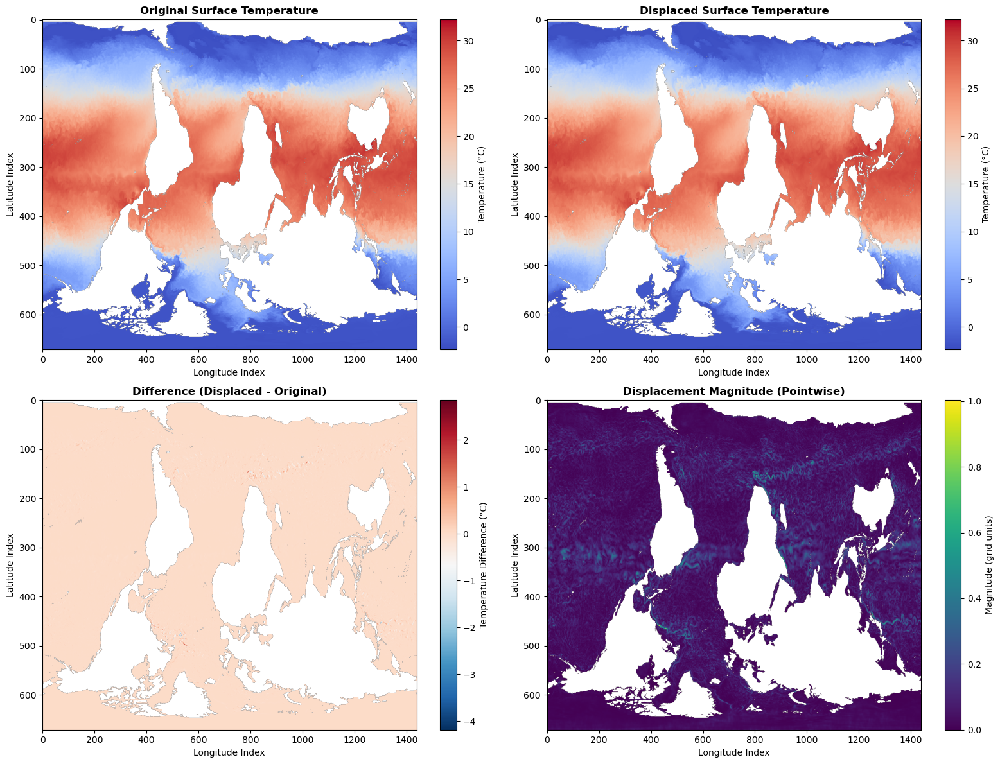


Statistics for surface temperature displacement:
Original - mean: 13.636185, std: 11.398827
Displaced - mean: 13.635568, std: 11.398602
Difference - mean: -0.000617, std: 0.044690
Difference - max abs: 4.186345


In [25]:
# Let's visualize one example: compare original vs displaced for surface temperature at depth 0
print("Visualizing displacement example: Surface temperature (depth 0, t0)")

# Get original and displaced data
depth_to_plot = 0
original_data = ds["data"].isel(time=sample_idx_t0, ch=1).values  # Channel 1 is surface temperature
displaced_data = pointwise_ensemble_members_t0[depth_to_plot]['displaced_channels']['ch1_thetao']

# Get displacement field info
disp_field = pointwise_displacement_fields_t0[depth_to_plot]
dx = disp_field['dx']
dy = disp_field['dy']

# Calculate difference
difference = displaced_data - original_data
displacement_magnitude = np.sqrt(dx**2 + dy**2)

# Create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot original
im0 = axes[0, 0].imshow(original_data, cmap='coolwarm', aspect='auto')
axes[0, 0].set_title('Original Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 0].set_xlabel('Longitude Index')
axes[0, 0].set_ylabel('Latitude Index')
plt.colorbar(im0, ax=axes[0, 0], label='Temperature (°C)')

# Plot displaced
im1 = axes[0, 1].imshow(displaced_data, cmap='coolwarm', aspect='auto')
axes[0, 1].set_title('Displaced Surface Temperature', fontweight='bold', fontsize=12)
axes[0, 1].set_xlabel('Longitude Index')
axes[0, 1].set_ylabel('Latitude Index')
plt.colorbar(im1, ax=axes[0, 1], label='Temperature (°C)')

# Plot difference
im2 = axes[1, 0].imshow(difference, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('Difference (Displaced - Original)', fontweight='bold', fontsize=12)
axes[1, 0].set_xlabel('Longitude Index')
axes[1, 0].set_ylabel('Latitude Index')
plt.colorbar(im2, ax=axes[1, 0], label='Temperature Difference (°C)')

# Plot displacement magnitude
im3 = axes[1, 1].imshow(displacement_magnitude, cmap='viridis', aspect='auto')
axes[1, 1].set_title('Displacement Magnitude (Pointwise)', fontweight='bold', fontsize=12)
axes[1, 1].set_xlabel('Longitude Index')
axes[1, 1].set_ylabel('Latitude Index')
plt.colorbar(im3, ax=axes[1, 1], label='Magnitude (grid units)')

plt.tight_layout()
plt.show()

# Print statistics
ocean_mask = ~land_masks_t0['d0'].values
orig_ocean = original_data[ocean_mask]
disp_ocean = displaced_data[ocean_mask]
diff_ocean = difference[ocean_mask]

print("\nStatistics for surface temperature displacement:")
print("="*60)
print(f"Original - mean: {np.nanmean(orig_ocean):.6f}, std: {np.nanstd(orig_ocean):.6f}")
print(f"Displaced - mean: {np.nanmean(disp_ocean):.6f}, std: {np.nanstd(disp_ocean):.6f}")
print(f"Difference - mean: {np.nanmean(diff_ocean):.6f}, std: {np.nanstd(diff_ocean):.6f}")
print(f"Difference - max abs: {np.nanmax(np.abs(diff_ocean)):.6f}")


Comparing one_vector vs pointwise displacement on surface temperature


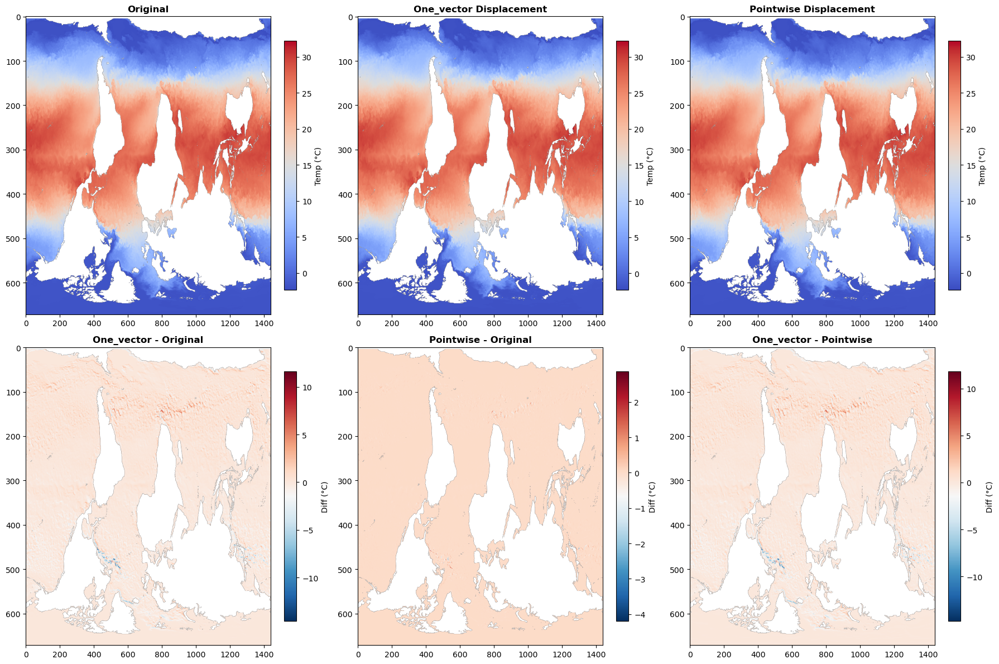


Statistics comparison (ocean points only):
One_vector displacement:
  Difference from original - mean: 0.042685, std: 0.635420
  Difference from original - max abs: 14.550637

Pointwise displacement:
  Difference from original - mean: -0.000617, std: 0.044690
  Difference from original - max abs: 4.186345

Difference between methods:
  One_vector vs Pointwise - mean: 0.043302, std: 0.633733
  One_vector vs Pointwise - max abs: 14.714987


In [26]:
# Visualize one_vector displacement example: compare with pointwise
print("Comparing one_vector vs pointwise displacement on surface temperature")

# Get one_vector displaced data (first combination, depth 0 surface)
one_vector_example = one_vector_ensemble_members_t0[0]
one_vector_displaced_data = one_vector_example['displaced_channels']['d0_ch1_thetao']

# Get pointwise displaced data
pointwise_displaced_data = pointwise_ensemble_members_t0[0]['displaced_channels']['ch1_thetao']

# Original data
original_data = ds["data"].isel(time=sample_idx_t0, ch=1).values

# Create visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Row 1: Original, one_vector, Pointwise
im0 = axes[0, 0].imshow(original_data, cmap='coolwarm', aspect='auto')
axes[0, 0].set_title('Original', fontweight='bold', fontsize=12)
plt.colorbar(im0, ax=axes[0, 0], label='Temp (°C)', fraction=0.046)

im1 = axes[0, 1].imshow(one_vector_displaced_data, cmap='coolwarm', aspect='auto')
axes[0, 1].set_title('One_vector Displacement', fontweight='bold', fontsize=12)
plt.colorbar(im1, ax=axes[0, 1], label='Temp (°C)', fraction=0.046)

im2 = axes[0, 2].imshow(pointwise_displaced_data, cmap='coolwarm', aspect='auto')
axes[0, 2].set_title('Pointwise Displacement', fontweight='bold', fontsize=12)
plt.colorbar(im2, ax=axes[0, 2], label='Temp (°C)', fraction=0.046)

# Row 2: Differences
one_vector_diff = one_vector_displaced_data - original_data
pointwise_diff = pointwise_displaced_data - original_data
method_diff = one_vector_displaced_data - pointwise_displaced_data

im3 = axes[1, 0].imshow(one_vector_diff, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('One_vector - Original', fontweight='bold', fontsize=12)
plt.colorbar(im3, ax=axes[1, 0], label='Diff (°C)', fraction=0.046)

im4 = axes[1, 1].imshow(pointwise_diff, cmap='RdBu_r', aspect='auto')
axes[1, 1].set_title('Pointwise - Original', fontweight='bold', fontsize=12)
plt.colorbar(im4, ax=axes[1, 1], label='Diff (°C)', fraction=0.046)

im5 = axes[1, 2].imshow(method_diff, cmap='RdBu_r', aspect='auto')
axes[1, 2].set_title('One_vector - Pointwise', fontweight='bold', fontsize=12)
plt.colorbar(im5, ax=axes[1, 2], label='Diff (°C)', fraction=0.046)

plt.tight_layout()
plt.show()

# Print statistics
ocean_mask = ~land_masks_t0['d0'].values
print("\nStatistics comparison (ocean points only):")
print("="*70)
print(f"One_vector displacement:")
print(f"  Difference from original - mean: {np.nanmean(one_vector_diff[ocean_mask]):.6f}, "
      f"std: {np.nanstd(one_vector_diff[ocean_mask]):.6f}")
print(f"  Difference from original - max abs: {np.nanmax(np.abs(one_vector_diff[ocean_mask])):.6f}")
print(f"\nPointwise displacement:")
print(f"  Difference from original - mean: {np.nanmean(pointwise_diff[ocean_mask]):.6f}, "
      f"std: {np.nanstd(pointwise_diff[ocean_mask]):.6f}")
print(f"  Difference from original - max abs: {np.nanmax(np.abs(pointwise_diff[ocean_mask])):.6f}")
print(f"\nDifference between methods:")
print(f"  One_vector vs Pointwise - mean: {np.nanmean(method_diff[ocean_mask]):.6f}, "
      f"std: {np.nanstd(method_diff[ocean_mask]):.6f}")
print(f"  One_vector vs Pointwise - max abs: {np.nanmax(np.abs(method_diff[ocean_mask])):.6f}")

---
---

## Create Ensemble Members  ##

- For fixed vector displacement , make 10 differnet member with different stochasticity
    - 4 * 10 = 40 members
- For pointwise displacement make 150 stochastic perburbation
    - 1 * 150 = 150 members

---
---
## Generate Multiple Ensemble Members with Seeds ##

Now we'll generate:
- **Method 1 (one_vector)**: 10 different perturbation members for each (u,v) vector
- **Method 2 (pointwise)**: 150 members with 150 different stochastic noises

### Method 1: One Vector UV - 10 Ensemble Members per (u,v) ###

Generate 10 different perturbation members for each (u,v) vector by using different seeds for the spatially correlated noise.

In [27]:
# Method 1: Create 10 displacement fields per (u,v) combination using different seeds
# This generates multiple ensemble members for the one_vector approach

import numpy as np

# Parameters
n_ensemble_members = 10  # Number of ensemble members per (u,v) combination
lambda_noise = 0.05
dt = 1.0

# Storage for all displacement fields
displacement_fields_multi_t0 = []
displacement_fields_multi_t1 = []

print(f"Generating {n_ensemble_members} ensemble members per (u,v) combination...")
print("="*70)

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for idx, (u_val, v_val, depth, label) in enumerate(uv_combinations_t0):
    # Create 2D arrays filled with the u and v values
    u_2d = np.full(grid_shape, u_val, dtype=np.float32)
    v_2d = np.full(grid_shape, v_val, dtype=np.float32)
    
    # Generate multiple ensemble members with different seeds
    for member_idx in range(n_ensemble_members):
        # Use unique seed for reproducibility
        seed = 1000 + idx * n_ensemble_members + member_idx
        np.random.seed(seed)
        
        # Create the correlation length field with these regions
        L_field = create_correlation_length_field((ny, nx), ocean_regions, 50)
        
        # Create amplitude field based on SSH anomaly magnitude
        ssh_std_val = float(np.nanstd(anomaly_ssh.values))
        amp_field = (np.abs(anomaly_ssh.values)) / ssh_std_val
        
        # Generate spatially-varying noise with seed
        seed = 2000 + member_idx 
        regional_noise = spatially_varying_gaussian_filter((ny, nx), L_field, amplitude=0.1, seed=seed)
        
        # Scale by amplitude field
        regional_noise_scaled = regional_noise * amp_field
        
        # Calculate displacements
        dx = dt * (u_2d + regional_noise_scaled)
        dy = dt * (v_2d + regional_noise_scaled)
        
        # Store the displacement field
        displacement_fields_multi_t0.append({
            'dx': dx,
            'dy': dy,
            'depth': depth,
            'label': f"{label}_m{member_idx}",
            'u_base': u_val,
            'v_base': v_val,
            'combination_idx': idx,
            'member_idx': member_idx,
            'seed': seed
        })
    
    if idx % 20 == 0:
        print(f"  Processed combination {idx}/{len(uv_combinations_t0)}: {label}")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for idx, (u_val, v_val, depth, label) in enumerate(uv_combinations_t1):
    # Create 2D arrays filled with the u and v values
    u_2d = np.full(grid_shape, u_val, dtype=np.float32)
    v_2d = np.full(grid_shape, v_val, dtype=np.float32)
    
    # Generate multiple ensemble members with different seeds
    for member_idx in range(n_ensemble_members):
        # Use unique seed for reproducibility
        seed = 1000 + idx * n_ensemble_members + member_idx
        np.random.seed(seed)
        
        # Create the correlation length field with these regions
        L_field = create_correlation_length_field((ny, nx), ocean_regions, 50)
        
        # Create amplitude field based on SSH anomaly magnitude
        ssh_std_val = float(np.nanstd(anomaly_ssh.values))
        amp_field = (np.abs(anomaly_ssh.values)) / ssh_std_val
        
        # Generate spatially-varying noise with seed
        seed = 3000 + member_idx
        regional_noise = spatially_varying_gaussian_filter((ny, nx), L_field, amplitude=0.1, seed=seed)
        
        # Scale by amplitude field
        regional_noise_scaled = regional_noise * amp_field
        
        # Calculate displacements
        dx = dt * (u_2d + regional_noise_scaled)
        dy = dt * (v_2d + regional_noise_scaled)
        
        # Store the displacement field
        displacement_fields_multi_t1.append({
            'dx': dx,
            'dy': dy,
            'depth': depth,
            'label': f"{label}_m{member_idx}",
            'u_base': u_val,
            'v_base': v_val,
            'combination_idx': idx,
            'member_idx': member_idx,
            'seed': seed
        })
    
    if idx % 20 == 0:
        print(f"  Processed combination {idx}/{len(uv_combinations_t1)}: {label}")

print(f"\n{'='*70}")
print(f"Created {len(displacement_fields_multi_t0)} total displacement fields for t0")
print(f"  ({len(uv_combinations_t0)} combinations × {n_ensemble_members} members)")
print(f"Created {len(displacement_fields_multi_t1)} total displacement fields for t1")
print(f"  ({len(uv_combinations_t1)} combinations × {n_ensemble_members} members)")
print(f"\nExample: First 3 members of first combination:")
for i in range(min(3, n_ensemble_members)):
    field = displacement_fields_multi_t0[i]
    print(f"  Member {i}: {field['label']}, seed={field['seed']}")

Generating 10 ensemble members per (u,v) combination...

Processing t0 (time=0):
  Processed combination 0/4: min_u_min_v

Processing t1 (time=1):
  Processed combination 0/4: min_u_min_v

Created 40 total displacement fields for t0
  (4 combinations × 10 members)
Created 40 total displacement fields for t1
  (4 combinations × 10 members)

Example: First 3 members of first combination:
  Member 0: min_u_min_v_m0, seed=2000
  Member 1: min_u_min_v_m1, seed=2001
  Member 2: min_u_min_v_m2, seed=2002


In [28]:
# Create ensemble members using the multi-member displacement fields for one_vector approach
print("Creating ensemble members from one_vector displacement fields (10 members per combination)...")
print("="*70)

# Store all ensemble members
one_vector_multi_ensemble_t0 = [] 
one_vector_multi_ensemble_t1 = []

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for idx, disp_field in enumerate(displacement_fields_multi_t0):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    member_idx = disp_field['member_idx']
    
    # For one_vector displacement, we apply to ALL channels across ALL depth levels
    all_displaced_channels = {}
    all_channels = []
    all_channel_names = []
    
    # Process all 21 depth levels
    for d in range(21):
        # Get the appropriate land mask for this depth
        land_mask = land_masks_t0[f'd{d}']
        
        # Apply displacement to all channels at this depth
        displaced_channels, channels, channel_names = displace_all_channels_at_depth(
            ds["data"], sample_idx_t0, d, dx, dy, land_mask
        )
        
        # Store with depth prefix to avoid key conflicts
        for key, value in displaced_channels.items():
            all_displaced_channels[f'd{d}_{key}'] = value
        
        all_channels.extend(channels)
        all_channel_names.extend([f'd{d}_{name}' for name in channel_names])
    
    # Store the ensemble member
    ensemble_member = {
        'depth_source': depth,
        'label': label,
        'time_idx': sample_idx_t0,
        'displacement_type': 'one_vector_multi',
        'u_base': disp_field['u_base'],
        'v_base': disp_field['v_base'],
        'member_idx': member_idx,
        'seed': disp_field['seed'],
        'displaced_channels': all_displaced_channels,
        'channel_indices': all_channels,
        'channel_names': all_channel_names
    }
    one_vector_multi_ensemble_t0.append(ensemble_member)
    
    if idx % 10 == 0:
        print(f"  Processed {idx}/{len(displacement_fields_multi_t0)} members")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for idx, disp_field in enumerate(displacement_fields_multi_t1):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    member_idx = disp_field['member_idx']
    
    # For one_vector displacement, we apply to ALL channels across ALL depth levels
    all_displaced_channels = {}
    all_channels = []
    all_channel_names = []
    
    # Process all 21 depth levels
    for d in range(21):
        # Get the appropriate land mask for this depth
        land_mask = land_masks_t1[f'd{d}']
        
        # Apply displacement to all channels at this depth
        displaced_channels, channels, channel_names = displace_all_channels_at_depth(
            ds["data"], sample_idx_t1, d, dx, dy, land_mask
        )
        
        # Store with depth prefix to avoid key conflicts
        for key, value in displaced_channels.items():
            all_displaced_channels[f'd{d}_{key}'] = value
        
        all_channels.extend(channels)
        all_channel_names.extend([f'd{d}_{name}' for name in channel_names])
    
    # Store the ensemble member
    ensemble_member = {
        'depth_source': depth,
        'label': label,
        'time_idx': sample_idx_t1,
        'displacement_type': 'one_vector_multi',
        'u_base': disp_field['u_base'],
        'v_base': disp_field['v_base'],
        'member_idx': member_idx,
        'seed': disp_field['seed'],
        'displaced_channels': all_displaced_channels,
        'channel_indices': all_channels,
        'channel_names': all_channel_names
    }
    one_vector_multi_ensemble_t1.append(ensemble_member)
    
    if idx % 10 == 0:
        print(f"  Processed {idx}/{len(displacement_fields_multi_t1)} members")

print(f"\n{'='*70}")
print(f"Created {len(one_vector_multi_ensemble_t0)} ensemble members for t0")
print(f"Created {len(one_vector_multi_ensemble_t1)} ensemble members for t1")
print(f"\nExample ensemble member:")
example = one_vector_multi_ensemble_t0[0]
print(f"  Label: {example['label']}")
print(f"  Member index: {example['member_idx']}")
print(f"  Seed: {example['seed']}")
print(f"  Depth source: {example['depth_source']}")
print(f"  Total displaced channels: {len(example['displaced_channels'])}")

Creating ensemble members from one_vector displacement fields (10 members per combination)...

Processing t0 (time=0):
  Processed 0/40 members
  Processed 10/40 members
  Processed 20/40 members
  Processed 30/40 members

Processing t1 (time=1):
  Processed 0/40 members
  Processed 10/40 members
  Processed 20/40 members
  Processed 30/40 members

Created 40 ensemble members for t0
Created 40 ensemble members for t1

Example ensemble member:
  Label: min_u_min_v_m0
  Member index: 0
  Seed: 2000
  Depth source: 0
  Total displaced channels: 85


### Method 2: Pointwise - 150 Ensemble Members ###

Generate 150 ensemble members with 150 different stochastic noise patterns using the spectral method.

In [29]:
# Method 2: Create 150 displacement fields using pointwise approach with different spectral noise seeds
# Each ensemble member will have unique spatially correlated noise patterns

import numpy as np

# Parameters
n_pointwise_members = 150  # Number of ensemble members
lambda_noise = 0.05
dt = 1.0
correlation_length = 10  # grid points
amplitude = 0.3

# Storage for all displacement fields
pointwise_displacement_fields_multi_t0 = []
pointwise_displacement_fields_multi_t1 = []

print(f"Generating {n_pointwise_members} ensemble members using pointwise displacement...")
print("="*70)

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for member_idx in range(n_pointwise_members):
    # Use unique seed for each member
    seed = 4000 + member_idx
    rng = np.random.default_rng(seed)
    
    # Generate unique spectral slope k for this member
    k = rng.normal(loc=-1.0, scale=0.3)
    
    # Generate spatially correlated multiplicative noise for u and v
    noise_spectral_u = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=seed)
    noise_spectral_v = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=seed)
    
    # Create displacement fields for each depth level
    for depth in range(21):
        # Extract u and v fields for this depth level
        uv_data = uv_depth_t0[f"d{depth}"]
        u_field = uv_data.isel(ch=0).values
        v_field = uv_data.isel(ch=1).values
        
        # Calculate displacements with multiplicative noise
        dx = dt * u_field * noise_spectral_u
        dy = dt * v_field * noise_spectral_v
        
        # Store the displacement field
        pointwise_displacement_fields_multi_t0.append({
            'dx': dx,
            'dy': dy,
            'depth': depth,
            'label': f'pointwise_m{member_idx}_d{depth}',
            'u_field_mean': np.nanmean(u_field),
            'v_field_mean': np.nanmean(v_field),
            'u_field_std': np.nanstd(u_field),
            'v_field_std': np.nanstd(v_field),
            'noise_type': 'multiplicative_spectral',
            'member_idx': member_idx,
            'seed': seed,
            'spectral_k': k
        })
    
    if member_idx % 30 == 0:
        print(f"  Generated member {member_idx}/{n_pointwise_members}")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for member_idx in range(n_pointwise_members):
    # Use unique seed for each member
    seed = 5000 + member_idx
    rng = np.random.default_rng(seed)
    
    # Generate unique spectral slope k for this member
    k = rng.normal(loc=-1.0, scale=0.3)
    
    # Generate spatially correlated multiplicative noise for u and v
    noise_spectral_u = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=seed)
    noise_spectral_v = spectral_correlated_noise((ny, nx), correlation_length, amplitude, spectral_slope=k, seed=seed)
    
    # Create displacement fields for each depth level
    for depth in range(21):
        # Extract u and v fields for this depth level
        uv_data = uv_depth_t1[f"d{depth}"]
        u_field = uv_data.isel(ch=0).values
        v_field = uv_data.isel(ch=1).values
        
        # Calculate displacements with multiplicative noise
        dx = dt * u_field * noise_spectral_u
        dy = dt * v_field * noise_spectral_v
        
        # Store the displacement field
        pointwise_displacement_fields_multi_t1.append({
            'dx': dx,
            'dy': dy,
            'depth': depth,
            'label': f'pointwise_m{member_idx}_d{depth}',
            'u_field_mean': np.nanmean(u_field),
            'v_field_mean': np.nanmean(v_field),
            'u_field_std': np.nanstd(u_field),
            'v_field_std': np.nanstd(v_field),
            'noise_type': 'multiplicative_spectral',
            'member_idx': member_idx,
            'seed': seed,
            'spectral_k': k
        })
    
    if member_idx % 30 == 0:
        print(f"  Generated member {member_idx}/{n_pointwise_members}")

print(f"\n{'='*70}")
print(f"Created {len(pointwise_displacement_fields_multi_t0)} total displacement fields for t0")
print(f"  ({n_pointwise_members} members × 21 depth levels)")
print(f"Created {len(pointwise_displacement_fields_multi_t1)} total displacement fields for t1")
print(f"  ({n_pointwise_members} members × 21 depth levels)")
print(f"\nExample: First member, first 3 depths:")
for i in range(3):
    field = pointwise_displacement_fields_multi_t0[i]
    print(f"  Depth {i}: {field['label']}, seed={field['seed']}, k={field['spectral_k']:.3f}")

Generating 150 ensemble members using pointwise displacement...

Processing t0 (time=0):
  Generated member 0/150
  Generated member 30/150
  Generated member 60/150
  Generated member 90/150
  Generated member 120/150

Processing t1 (time=1):
  Generated member 0/150
  Generated member 30/150
  Generated member 60/150
  Generated member 90/150
  Generated member 120/150

Created 3150 total displacement fields for t0
  (150 members × 21 depth levels)
Created 3150 total displacement fields for t1
  (150 members × 21 depth levels)

Example: First member, first 3 depths:
  Depth 0: pointwise_m0_d0, seed=4000, k=-1.141
  Depth 1: pointwise_m0_d1, seed=4000, k=-1.141
  Depth 2: pointwise_m0_d2, seed=4000, k=-1.141


In [30]:
# Create ensemble members using the multi-member pointwise displacement fields
print("Creating ensemble members from pointwise displacement fields (150 members)...")
print("="*70)

# Store all ensemble members
pointwise_multi_ensemble_t0 = []
pointwise_multi_ensemble_t1 = []

# Process t0 (time = t-1)
print(f"\nProcessing t0 (time={sample_idx_t0}):")
for idx, disp_field in enumerate(pointwise_displacement_fields_multi_t0):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    member_idx = disp_field['member_idx']
    
    # Get the appropriate land mask
    land_mask = land_masks_t0[f'd{depth}']
    
    # Apply displacement to all channels at this depth
    displaced_channels, channels, channel_names = displace_all_channels_at_depth(
        ds["data"], sample_idx_t0, depth, dx, dy, land_mask
    )
    
    # Store the ensemble member
    ensemble_member = {
        'depth': depth,
        'label': label,
        'time_idx': sample_idx_t0,
        'displacement_type': 'pointwise_multi',
        'displacement_dx_mean': np.nanmean(dx),
        'displacement_dy_mean': np.nanmean(dy),
        'member_idx': member_idx,
        'seed': disp_field['seed'],
        'spectral_k': disp_field['spectral_k'],
        'displaced_channels': displaced_channels,
        'channel_indices': channels,
        'channel_names': channel_names
    }
    pointwise_multi_ensemble_t0.append(ensemble_member)
    
    if idx % 500 == 0:
        print(f"  Processed {idx}/{len(pointwise_displacement_fields_multi_t0)} displacement fields")

# Process t1 (time = t)
print(f"\nProcessing t1 (time={sample_idx_t1}):")
for idx, disp_field in enumerate(pointwise_displacement_fields_multi_t1):
    depth = disp_field['depth']
    dx = disp_field['dx']
    dy = disp_field['dy']
    dy = -dy  # Negate dy to match image coordinate system
    label = disp_field['label']
    member_idx = disp_field['member_idx']
    
    # Get the appropriate land mask
    land_mask = land_masks_t1[f'd{depth}']
    
    # Apply displacement to all channels at this depth
    displaced_channels, channels, channel_names = displace_all_channels_at_depth(
        ds["data"], sample_idx_t1, depth, dx, dy, land_mask
    )
    
    # Store the ensemble member
    ensemble_member = {
        'depth': depth,
        'label': label,
        'time_idx': sample_idx_t1,
        'displacement_type': 'pointwise_multi',
        'displacement_dx_mean': np.nanmean(dx),
        'displacement_dy_mean': np.nanmean(dy),
        'member_idx': member_idx,
        'seed': disp_field['seed'],
        'spectral_k': disp_field['spectral_k'],
        'displaced_channels': displaced_channels,
        'channel_indices': channels,
        'channel_names': channel_names
    }
    pointwise_multi_ensemble_t1.append(ensemble_member)
    
    if idx % 500 == 0:
        print(f"  Processed {idx}/{len(pointwise_displacement_fields_multi_t1)} displacement fields")

print(f"\n{'='*70}")
print(f"Created {len(pointwise_multi_ensemble_t0)} ensemble members for t0")
print(f"Created {len(pointwise_multi_ensemble_t1)} ensemble members for t1")
print(f"\nExample ensemble member (member 0, depth 0):")
example = pointwise_multi_ensemble_t0[0]
print(f"  Label: {example['label']}")
print(f"  Member index: {example['member_idx']}")
print(f"  Seed: {example['seed']}")
print(f"  Spectral k: {example['spectral_k']:.3f}")
print(f"  Depth: {example['depth']}")
print(f"  Channels displaced: {example['channel_names']}")
print(f"  Mean dx: {example['displacement_dx_mean']:.6f}")
print(f"  Mean dy: {example['displacement_dy_mean']:.6f}")

Creating ensemble members from pointwise displacement fields (150 members)...

Processing t0 (time=0):
  Processed 0/3150 displacement fields
  Processed 500/3150 displacement fields
  Processed 1000/3150 displacement fields
  Processed 1500/3150 displacement fields
  Processed 2000/3150 displacement fields
  Processed 2500/3150 displacement fields
  Processed 3000/3150 displacement fields

Processing t1 (time=1):
  Processed 0/3150 displacement fields
  Processed 500/3150 displacement fields
  Processed 1000/3150 displacement fields
  Processed 1500/3150 displacement fields
  Processed 2000/3150 displacement fields
  Processed 2500/3150 displacement fields
  Processed 3000/3150 displacement fields

Created 3150 ensemble members for t0
Created 3150 ensemble members for t1

Example ensemble member (member 0, depth 0):
  Label: pointwise_m0_d0
  Member index: 0
  Seed: 4000
  Spectral k: -1.141
  Depth: 0
  Channels displaced: ['ssh', 'thetao', 'so', 'uo', 'vo']
  Mean dx: 0.003125
  Mea

## Ensemble Statistics: Anomaly Analysis for SSH and THETAO Surface at t1

Calculate and visualize the variance of anomalies (member - ground truth) across all ensemble members for ssh and thetao surface channels at time step t1. We'll show the standard deviation (RMSE) for clearer interpretation.

In [36]:
# Extract ground truth and ensemble members for ssh and thetao at t1
print("Calculating anomaly statistics (member - ground truth) for t1...")
print("="*70)

# Get ground truth data at t1 (sample_idx_t1)
# Channel 0: ssh, Channel 1: thetao (surface)
ssh_groundtruth = ds_total["data"].isel(time=sample_idx_t1, ch=0).values
thetao_groundtruth = ds_total["data"].isel(time=sample_idx_t1, ch=1).values

print(f"\nGround Truth shapes:")
print(f"  SSH: {ssh_groundtruth.shape}")
print(f"  THETAO: {thetao_groundtruth.shape}")

# Store anomalies for all ensemble members (member - ground truth)
ssh_anomalies = []
thetao_anomalies = []

# Process each ensemble member
for idx, member in enumerate(one_vector_multi_ensemble_t1):
    # Get perturbed data for this member
    ssh_member = member['displaced_channels']['d0_ch0_ssh']
    thetao_member = member['displaced_channels']['d0_ch1_thetao']
    
    # Calculate anomaly: member - ground truth
    ssh_anomaly = ssh_member - ssh_groundtruth
    thetao_anomaly = thetao_member - thetao_groundtruth
    
    ssh_anomalies.append(ssh_anomaly)
    thetao_anomalies.append(thetao_anomaly)

# Convert to numpy arrays: shape (n_members, height, width)
ssh_anomalies = np.array(ssh_anomalies)
thetao_anomalies = np.array(thetao_anomalies)

print(f"\nAnomaly ensemble shapes:")
print(f"  SSH: {ssh_anomalies.shape}")
print(f"  THETAO: {thetao_anomalies.shape}")
print(f"  Number of ensemble members: {len(one_vector_multi_ensemble_t1)}")

# Calculate mean and variance of anomalies across ensemble members (axis=0)
ssh_anomaly_mean = np.mean(ssh_anomalies, axis=0)
ssh_anomaly_var = np.var(ssh_anomalies, axis=0)
ssh_anomaly_std = np.sqrt(ssh_anomaly_var)  # RMSE

thetao_anomaly_mean = np.mean(thetao_anomalies, axis=0)
thetao_anomaly_var = np.var(thetao_anomalies, axis=0)
thetao_anomaly_std = np.sqrt(thetao_anomaly_var)  # RMSE

print(f"\nSSH Anomaly Statistics:")
print(f"  Mean range: [{np.nanmin(ssh_anomaly_mean):.4f}, {np.nanmax(ssh_anomaly_mean):.4f}]")
print(f"  Variance range: [{np.nanmin(ssh_anomaly_var):.6f}, {np.nanmax(ssh_anomaly_var):.6f}]")
print(f"  Std Dev (RMSE) range: [{np.nanmin(ssh_anomaly_std):.6f}, {np.nanmax(ssh_anomaly_std):.6f}]")
print(f"  Mean std: {np.nanmean(ssh_anomaly_std):.6f}")

print(f"\nTHETAO Anomaly Statistics:")
print(f"  Mean range: [{np.nanmin(thetao_anomaly_mean):.4f}, {np.nanmax(thetao_anomaly_mean):.4f}]")
print(f"  Variance range: [{np.nanmin(thetao_anomaly_var):.6f}, {np.nanmax(thetao_anomaly_var):.6f}]")
print(f"  Std Dev (RMSE) range: [{np.nanmin(thetao_anomaly_std):.6f}, {np.nanmax(thetao_anomaly_std):.6f}]")
print(f"  Mean std: {np.nanmean(thetao_anomaly_std):.6f}")

Calculating anomaly statistics (member - ground truth) for t1...

Ground Truth shapes:
  SSH: (672, 1440)
  THETAO: (672, 1440)

Anomaly ensemble shapes:
  SSH: (40, 672, 1440)
  THETAO: (40, 672, 1440)
  Number of ensemble members: 40

SSH Anomaly Statistics:
  Mean range: [-0.3430, 0.7290]
  Variance range: [0.000000, 0.285452]
  Std Dev (RMSE) range: [0.000000, 0.534277]
  Mean std: 0.033500

THETAO Anomaly Statistics:
  Mean range: [-7.0083, 7.4817]
  Variance range: [0.000000, 42.173144]
  Std Dev (RMSE) range: [0.000000, 6.494085]
  Mean std: 0.297179


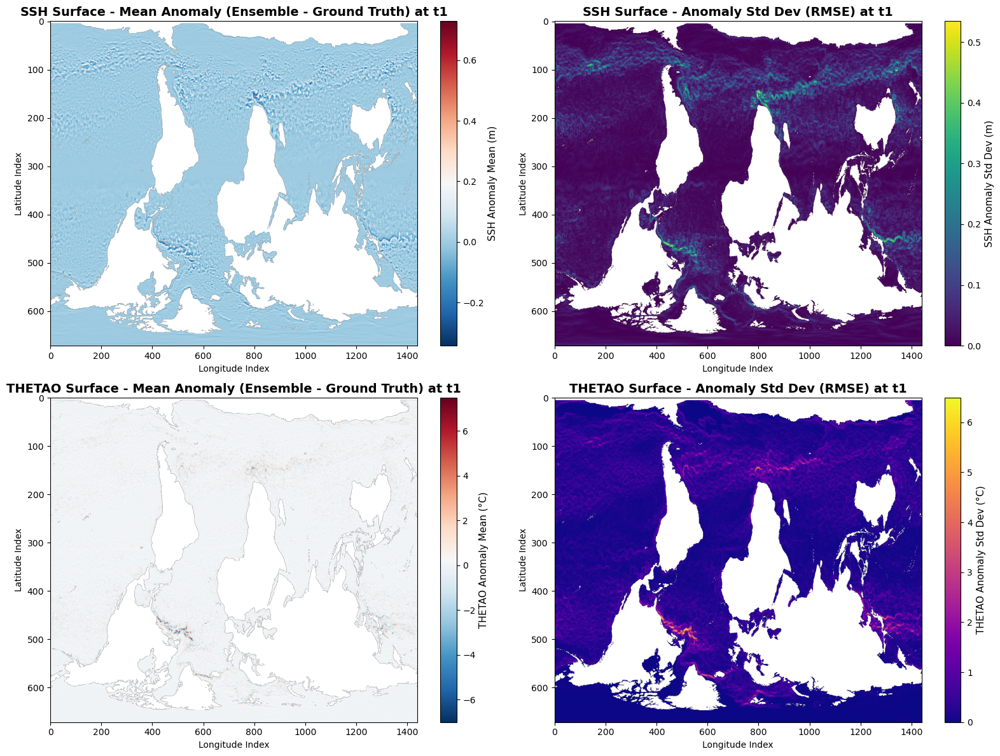


Visualization complete for t1 anomaly statistics.
Total ensemble members: 40


In [37]:
# Visualize SSH and THETAO Anomaly: Mean and Standard Deviation (RMSE)
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# SSH Anomaly Mean
im0 = axes[0, 0].imshow(ssh_anomaly_mean, cmap='RdBu_r', aspect='auto')
axes[0, 0].set_title('SSH Surface - Mean Anomaly (Ensemble - Ground Truth) at t1', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Longitude Index')
axes[0, 0].set_ylabel('Latitude Index')
cbar0 = plt.colorbar(im0, ax=axes[0, 0])
cbar0.set_label('SSH Anomaly Mean (m)', fontsize=11)

# SSH Anomaly Standard Deviation (RMSE)
im1 = axes[0, 1].imshow(ssh_anomaly_std, cmap='viridis', aspect='auto')
axes[0, 1].set_title('SSH Surface - Anomaly Std Dev (RMSE) at t1', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Longitude Index')
axes[0, 1].set_ylabel('Latitude Index')
cbar1 = plt.colorbar(im1, ax=axes[0, 1])
cbar1.set_label('SSH Anomaly Std Dev (m)', fontsize=11)

# THETAO Anomaly Mean
im2 = axes[1, 0].imshow(thetao_anomaly_mean, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('THETAO Surface - Mean Anomaly (Ensemble - Ground Truth) at t1', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Longitude Index')
axes[1, 0].set_ylabel('Latitude Index')
cbar2 = plt.colorbar(im2, ax=axes[1, 0])
cbar2.set_label('THETAO Anomaly Mean (°C)', fontsize=11)

# THETAO Anomaly Standard Deviation (RMSE)
im3 = axes[1, 1].imshow(thetao_anomaly_std, cmap='plasma', aspect='auto')
axes[1, 1].set_title('THETAO Surface - Anomaly Std Dev (RMSE) at t1', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Longitude Index')
axes[1, 1].set_ylabel('Latitude Index')
cbar3 = plt.colorbar(im3, ax=axes[1, 1])
cbar3.set_label('THETAO Anomaly Std Dev (°C)', fontsize=11)

plt.tight_layout()
plt.show()

print(f"\nVisualization complete for t1 anomaly statistics.")
print(f"Total ensemble members: {len(one_vector_multi_ensemble_t1)}")

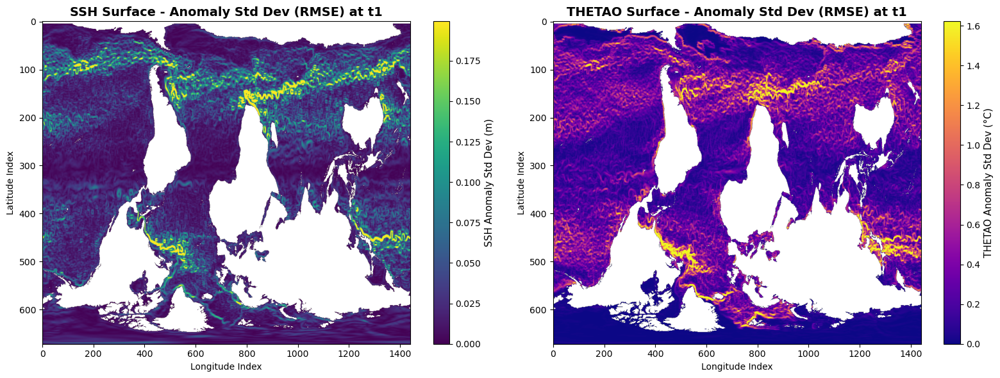


Summary Statistics:

SSH Anomaly Std Dev:
  Min: 0.000000 m
  Max: 0.534277 m
  Mean: 0.033500 m
  Median: 0.020972 m
  99th percentile: 0.199356 m

THETAO Anomaly Std Dev:
  Min: 0.000000 °C
  Max: 6.494085 °C
  Mean: 0.297179 °C
  Median: 0.201429 °C
  99th percentile: 1.622017 °C


In [38]:
# Additional visualization: Side-by-side comparison of Std Dev for both channels
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# SSH Anomaly Standard Deviation with better color range
vmax_ssh = np.nanpercentile(ssh_anomaly_std, 99)  # Use 99th percentile to avoid outliers
im0 = axes[0].imshow(ssh_anomaly_std, cmap='viridis', aspect='auto', vmin=0, vmax=vmax_ssh)
axes[0].set_title('SSH Surface - Anomaly Std Dev (RMSE) at t1', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Longitude Index')
axes[0].set_ylabel('Latitude Index')
cbar0 = plt.colorbar(im0, ax=axes[0])
cbar0.set_label('SSH Anomaly Std Dev (m)', fontsize=11)

# THETAO Anomaly Standard Deviation with better color range
vmax_thetao = np.nanpercentile(thetao_anomaly_std, 99)  # Use 99th percentile to avoid outliers
im1 = axes[1].imshow(thetao_anomaly_std, cmap='plasma', aspect='auto', vmin=0, vmax=vmax_thetao)
axes[1].set_title('THETAO Surface - Anomaly Std Dev (RMSE) at t1', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Longitude Index')
axes[1].set_ylabel('Latitude Index')
cbar1 = plt.colorbar(im1, ax=axes[1])
cbar1.set_label('THETAO Anomaly Std Dev (°C)', fontsize=11)

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics:")
print("="*70)
print(f"\nSSH Anomaly Std Dev:")
print(f"  Min: {np.nanmin(ssh_anomaly_std):.6f} m")
print(f"  Max: {np.nanmax(ssh_anomaly_std):.6f} m")
print(f"  Mean: {np.nanmean(ssh_anomaly_std):.6f} m")
print(f"  Median: {np.nanmedian(ssh_anomaly_std):.6f} m")
print(f"  99th percentile: {vmax_ssh:.6f} m")

print(f"\nTHETAO Anomaly Std Dev:")
print(f"  Min: {np.nanmin(thetao_anomaly_std):.6f} °C")
print(f"  Max: {np.nanmax(thetao_anomaly_std):.6f} °C")
print(f"  Mean: {np.nanmean(thetao_anomaly_std):.6f} °C")
print(f"  Median: {np.nanmedian(thetao_anomaly_std):.6f} °C")
print(f"  99th percentile: {vmax_thetao:.6f} °C")

## Visualize Anomaly Statistics for `pointwise_multi_ensemble_t1`

Same visualization (std of anomaly for surface ssh and thetao) for pointwise multi ensemble members at t1.

In [43]:
# Extract ground truth and ensemble members for ssh and thetao at t1 (pointwise)
print("Calculating anomaly statistics (member - ground truth) for t1 (pointwise)...")
print("="*70)

# Get ground truth data at t1 (sample_idx_t1)
# Channel 0: ssh, Channel 1: thetao (surface)
ssh_groundtruth = ds_total["data"].isel(time=sample_idx_t1, ch=0).values
thetao_groundtruth = ds_total["data"].isel(time=sample_idx_t1, ch=1).values

print(f"\nGround Truth shapes:")
print(f"  SSH: {ssh_groundtruth.shape}")
print(f"  THETAO: {thetao_groundtruth.shape}")

# Store anomalies for all ensemble members (member - ground truth)
ssh_anomalies_pointwise = []
thetao_anomalies_pointwise = []

# Process each ensemble member - only those with depth 0 (surface)
for idx, member in enumerate(pointwise_multi_ensemble_t1):
    # Only process surface members (depth 0)
    if member['depth'] != 0:
        continue
        
    # Get perturbed data for this member
    ssh_member = member['displaced_channels']['ch0_ssh']
    thetao_member = member['displaced_channels']['ch1_thetao']
    
    # Calculate anomaly: member - ground truth
    ssh_anomaly = ssh_member - ssh_groundtruth
    thetao_anomaly = thetao_member - thetao_groundtruth
    
    ssh_anomalies_pointwise.append(ssh_anomaly)
    thetao_anomalies_pointwise.append(thetao_anomaly)

# Convert to numpy arrays: shape (n_members, height, width)
ssh_anomalies_pointwise = np.array(ssh_anomalies_pointwise)
thetao_anomalies_pointwise = np.array(thetao_anomalies_pointwise)

print(f"\nAnomaly ensemble shapes:")
print(f"  SSH: {ssh_anomalies_pointwise.shape}")
print(f"  THETAO: {thetao_anomalies_pointwise.shape}")
print(f"  Number of surface ensemble members: {len(ssh_anomalies_pointwise)}")

# Calculate mean and variance of anomalies across ensemble members (axis=0)
ssh_anomaly_mean_pointwise = np.mean(ssh_anomalies_pointwise, axis=0)
ssh_anomaly_var_pointwise = np.var(ssh_anomalies_pointwise, axis=0)
ssh_anomaly_std_pointwise = np.sqrt(ssh_anomaly_var_pointwise)  # RMSE

thetao_anomaly_mean_pointwise = np.mean(thetao_anomalies_pointwise, axis=0)
thetao_anomaly_var_pointwise = np.var(thetao_anomalies_pointwise, axis=0)
thetao_anomaly_std_pointwise = np.sqrt(thetao_anomaly_var_pointwise)  # RMSE

print(f"\nSSH Anomaly Statistics (Pointwise):")
print(f"  Mean range: [{np.nanmin(ssh_anomaly_mean_pointwise):.4f}, {np.nanmax(ssh_anomaly_mean_pointwise):.4f}]")
print(f"  Variance range: [{np.nanmin(ssh_anomaly_var_pointwise):.6f}, {np.nanmax(ssh_anomaly_var_pointwise):.6f}]")
print(f"  Std Dev (RMSE) range: [{np.nanmin(ssh_anomaly_std_pointwise):.6f}, {np.nanmax(ssh_anomaly_std_pointwise):.6f}]")
print(f"  Mean std: {np.nanmean(ssh_anomaly_std_pointwise):.6f}")

print(f"\nTHETAO Anomaly Statistics (Pointwise):")
print(f"  Mean range: [{np.nanmin(thetao_anomaly_mean_pointwise):.4f}, {np.nanmax(thetao_anomaly_mean_pointwise):.4f}]")
print(f"  Variance range: [{np.nanmin(thetao_anomaly_var_pointwise):.6f}, {np.nanmax(thetao_anomaly_var_pointwise):.6f}]")
print(f"  Std Dev (RMSE) range: [{np.nanmin(thetao_anomaly_std_pointwise):.6f}, {np.nanmax(thetao_anomaly_std_pointwise):.6f}]")
print(f"  Mean std: {np.nanmean(thetao_anomaly_std_pointwise):.6f}")

Calculating anomaly statistics (member - ground truth) for t1 (pointwise)...

Ground Truth shapes:
  SSH: (672, 1440)
  THETAO: (672, 1440)

Anomaly ensemble shapes:
  SSH: (150, 672, 1440)
  THETAO: (150, 672, 1440)
  Number of surface ensemble members: 150

SSH Anomaly Statistics (Pointwise):
  Mean range: [-0.2228, 0.3762]
  Variance range: [0.000000, 0.010525]
  Std Dev (RMSE) range: [0.000000, 0.102593]
  Mean std: 0.000476

THETAO Anomaly Statistics (Pointwise):
  Mean range: [-3.5944, 3.2447]
  Variance range: [0.000000, 0.918991]
  Std Dev (RMSE) range: [0.000000, 0.958640]
  Mean std: 0.003970


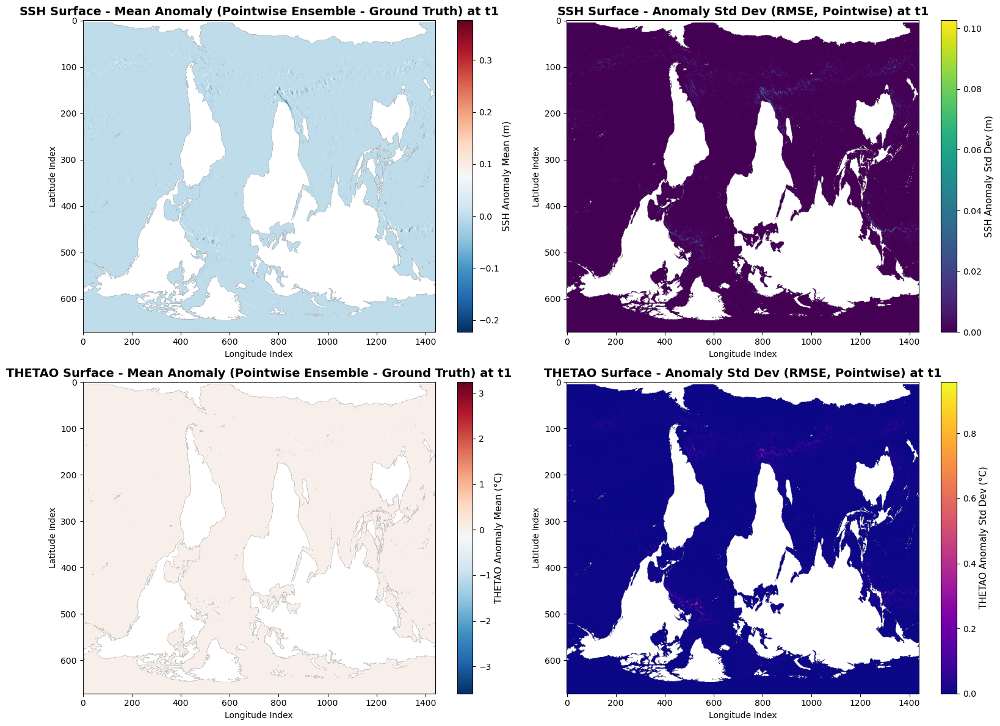


Visualization complete for t1 anomaly statistics (pointwise).
Total ensemble members: 3150


In [44]:
# Visualize SSH and THETAO Anomaly: Mean and Standard Deviation (RMSE) - Pointwise
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# SSH Anomaly Mean
im0 = axes[0, 0].imshow(ssh_anomaly_mean_pointwise, cmap='RdBu_r', aspect='auto')
axes[0, 0].set_title('SSH Surface - Mean Anomaly (Pointwise Ensemble - Ground Truth) at t1', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('Longitude Index')
axes[0, 0].set_ylabel('Latitude Index')
cbar0 = plt.colorbar(im0, ax=axes[0, 0])
cbar0.set_label('SSH Anomaly Mean (m)', fontsize=11)

# SSH Anomaly Standard Deviation (RMSE)
im1 = axes[0, 1].imshow(ssh_anomaly_std_pointwise, cmap='viridis', aspect='auto')
axes[0, 1].set_title('SSH Surface - Anomaly Std Dev (RMSE, Pointwise) at t1', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('Longitude Index')
axes[0, 1].set_ylabel('Latitude Index')
cbar1 = plt.colorbar(im1, ax=axes[0, 1])
cbar1.set_label('SSH Anomaly Std Dev (m)', fontsize=11)

# THETAO Anomaly Mean
im2 = axes[1, 0].imshow(thetao_anomaly_mean_pointwise, cmap='RdBu_r', aspect='auto')
axes[1, 0].set_title('THETAO Surface - Mean Anomaly (Pointwise Ensemble - Ground Truth) at t1', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('Longitude Index')
axes[1, 0].set_ylabel('Latitude Index')
cbar2 = plt.colorbar(im2, ax=axes[1, 0])
cbar2.set_label('THETAO Anomaly Mean (°C)', fontsize=11)

# THETAO Anomaly Standard Deviation (RMSE)
im3 = axes[1, 1].imshow(thetao_anomaly_std_pointwise, cmap='plasma', aspect='auto')
axes[1, 1].set_title('THETAO Surface - Anomaly Std Dev (RMSE, Pointwise) at t1', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('Longitude Index')
axes[1, 1].set_ylabel('Latitude Index')
cbar3 = plt.colorbar(im3, ax=axes[1, 1])
cbar3.set_label('THETAO Anomaly Std Dev (°C)', fontsize=11)

plt.tight_layout()
plt.show()

print(f"\nVisualization complete for t1 anomaly statistics (pointwise).")
print(f"Total ensemble members: {len(pointwise_multi_ensemble_t1)}")

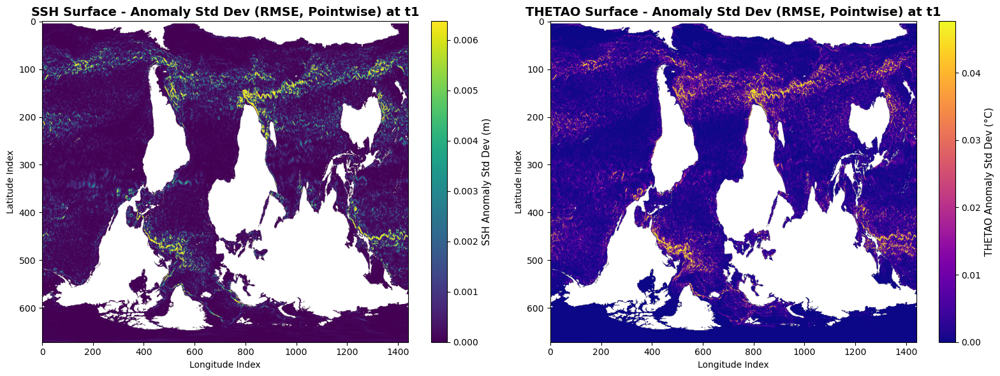


Summary Statistics (Pointwise):

SSH Anomaly Std Dev:
  Min: 0.000000 m
  Max: 0.102593 m
  Mean: 0.000476 m
  Median: 0.000093 m
  99th percentile: 0.006369 m

THETAO Anomaly Std Dev:
  Min: 0.000000 °C
  Max: 0.958640 °C
  Mean: 0.003970 °C
  Median: 0.001007 °C
  99th percentile: 0.047644 °C


In [45]:
# Additional visualization: Side-by-side comparison of Std Dev for both channels (Pointwise)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# SSH Anomaly Standard Deviation with better color range
vmax_ssh_pointwise = np.nanpercentile(ssh_anomaly_std_pointwise, 99)  # Use 99th percentile to avoid outliers
im0 = axes[0].imshow(ssh_anomaly_std_pointwise, cmap='viridis', aspect='auto', vmin=0, vmax=vmax_ssh_pointwise)
axes[0].set_title('SSH Surface - Anomaly Std Dev (RMSE, Pointwise) at t1', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Longitude Index')
axes[0].set_ylabel('Latitude Index')
cbar0 = plt.colorbar(im0, ax=axes[0])
cbar0.set_label('SSH Anomaly Std Dev (m)', fontsize=11)

# THETAO Anomaly Standard Deviation with better color range
vmax_thetao_pointwise = np.nanpercentile(thetao_anomaly_std_pointwise, 99)  # Use 99th percentile to avoid outliers
im1 = axes[1].imshow(thetao_anomaly_std_pointwise, cmap='plasma', aspect='auto', vmin=0, vmax=vmax_thetao_pointwise)
axes[1].set_title('THETAO Surface - Anomaly Std Dev (RMSE, Pointwise) at t1', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Longitude Index')
axes[1].set_ylabel('Latitude Index')
cbar1 = plt.colorbar(im1, ax=axes[1])
cbar1.set_label('THETAO Anomaly Std Dev (°C)', fontsize=11)

plt.tight_layout()
plt.show()

# Print summary statistics
print("\nSummary Statistics (Pointwise):")
print("="*70)
print(f"\nSSH Anomaly Std Dev:")
print(f"  Min: {np.nanmin(ssh_anomaly_std_pointwise):.6f} m")
print(f"  Max: {np.nanmax(ssh_anomaly_std_pointwise):.6f} m")
print(f"  Mean: {np.nanmean(ssh_anomaly_std_pointwise):.6f} m")
print(f"  Median: {np.nanmedian(ssh_anomaly_std_pointwise):.6f} m")
print(f"  99th percentile: {vmax_ssh_pointwise:.6f} m")

print(f"\nTHETAO Anomaly Std Dev:")
print(f"  Min: {np.nanmin(thetao_anomaly_std_pointwise):.6f} °C")
print(f"  Max: {np.nanmax(thetao_anomaly_std_pointwise):.6f} °C")
print(f"  Mean: {np.nanmean(thetao_anomaly_std_pointwise):.6f} °C")
print(f"  Median: {np.nanmedian(thetao_anomaly_std_pointwise):.6f} °C")
print(f"  99th percentile: {vmax_thetao_pointwise:.6f} °C")

## Memory Cleaning ##
Clean the momory...


In [ ]:
del uv_depth_t0, uv_depth_t1
del uv_combinations_t0, uv_combinations_t1
del noise_spectral_u_t0, noise_spectral_v_t1
del regional_noise, regional_noise_scaled
del land_masks_t0, land_masks_t1
del displacement_fields_multi_t0, displacement_fields_multi_t1
del pointwise_displacement_fields_multi_t0, pointwise_displacement_fields_multi_t1

import gc
gc.collect()

## Ensemble Mean and Variance: Raw Values for SSH and THETAO Surface

Calculate and visualize the mean and variance across all ensemble members for the raw values (not anomalies) of ssh and thetao at the surface.

In [46]:
# Calculate ensemble mean and variance for raw values (one-vector method)
print("Calculating ensemble mean and variance for SSH and THETAO (one-vector method)...")
print("="*70)

# Store all ensemble member values
ssh_ensemble = []
thetao_ensemble = []

# Process each ensemble member
for idx, member in enumerate(one_vector_multi_ensemble_t1):
    # Get perturbed data for this member
    ssh_member = member['displaced_channels']['d0_ch0_ssh']
    thetao_member = member['displaced_channels']['d0_ch1_thetao']
    
    ssh_ensemble.append(ssh_member)
    thetao_ensemble.append(thetao_member)

# Convert to numpy arrays: shape (n_members, height, width)
ssh_ensemble = np.array(ssh_ensemble)
thetao_ensemble = np.array(thetao_ensemble)

print(f"\nEnsemble shapes:")
print(f"  SSH: {ssh_ensemble.shape}")
print(f"  THETAO: {thetao_ensemble.shape}")
print(f"  Number of ensemble members: {len(ssh_ensemble)}")

# Calculate mean and variance across ensemble members (axis=0)
ssh_mean = np.mean(ssh_ensemble, axis=0)
ssh_var = np.var(ssh_ensemble, axis=0)
ssh_std = np.sqrt(ssh_var)

thetao_mean = np.mean(thetao_ensemble, axis=0)
thetao_var = np.var(thetao_ensemble, axis=0)
thetao_std = np.sqrt(thetao_var)

print(f"\nSSH Statistics (One-Vector):")
print(f"  Mean range: [{np.nanmin(ssh_mean):.4f}, {np.nanmax(ssh_mean):.4f}]")
print(f"  Variance range: [{np.nanmin(ssh_var):.6f}, {np.nanmax(ssh_var):.6f}]")
print(f"  Std Dev range: [{np.nanmin(ssh_std):.6f}, {np.nanmax(ssh_std):.6f}]")
print(f"  Mean std: {np.nanmean(ssh_std):.6f}")

print(f"\nTHETAO Statistics (One-Vector):")
print(f"  Mean range: [{np.nanmin(thetao_mean):.4f}, {np.nanmax(thetao_mean):.4f}]")
print(f"  Variance range: [{np.nanmin(thetao_var):.6f}, {np.nanmax(thetao_var):.6f}]")
print(f"  Std Dev range: [{np.nanmin(thetao_std):.6f}, {np.nanmax(thetao_std):.6f}]")
print(f"  Mean std: {np.nanmean(thetao_std):.6f}")

# Also calculate coefficient of variation (CV = std / mean) for relative variability
ssh_cv = ssh_std / np.abs(ssh_mean)
thetao_cv = thetao_std / np.abs(thetao_mean)

print(f"\nCoefficient of Variation (CV = std/|mean|):")
print(f"  SSH CV range: [{np.nanmin(ssh_cv):.6f}, {np.nanmax(ssh_cv):.6f}]")
print(f"  SSH mean CV: {np.nanmean(ssh_cv):.6f}")
print(f"  THETAO CV range: [{np.nanmin(thetao_cv):.6f}, {np.nanmax(thetao_cv):.6f}]")
print(f"  THETAO mean CV: {np.nanmean(thetao_cv):.6f}")

Calculating ensemble mean and variance for SSH and THETAO (one-vector method)...

Ensemble shapes:
  SSH: (40, 672, 1440)
  THETAO: (40, 672, 1440)
  Number of ensemble members: 40

SSH Statistics (One-Vector):
  Mean range: [-1.9174, 1.2599]
  Variance range: [0.000000, 0.285452]
  Std Dev range: [0.000000, 0.534277]
  Mean std: 0.033500

THETAO Statistics (One-Vector):
  Mean range: [-2.2096, 32.0145]
  Variance range: [0.000000, 42.173144]
  Std Dev range: [0.000000, 6.494085]
  Mean std: 0.297179

Coefficient of Variation (CV = std/|mean|):
  SSH CV range: [0.000000, 43132.473869]
  SSH mean CV: 0.464044
  THETAO CV range: [0.000000, 4200.130910]
  THETAO mean CV: 0.209746


/tmp/ipykernel_863165/3614069771.py:49: RuntimeWarning: invalid value encountered in divide
  ssh_cv = ssh_std / np.abs(ssh_mean)


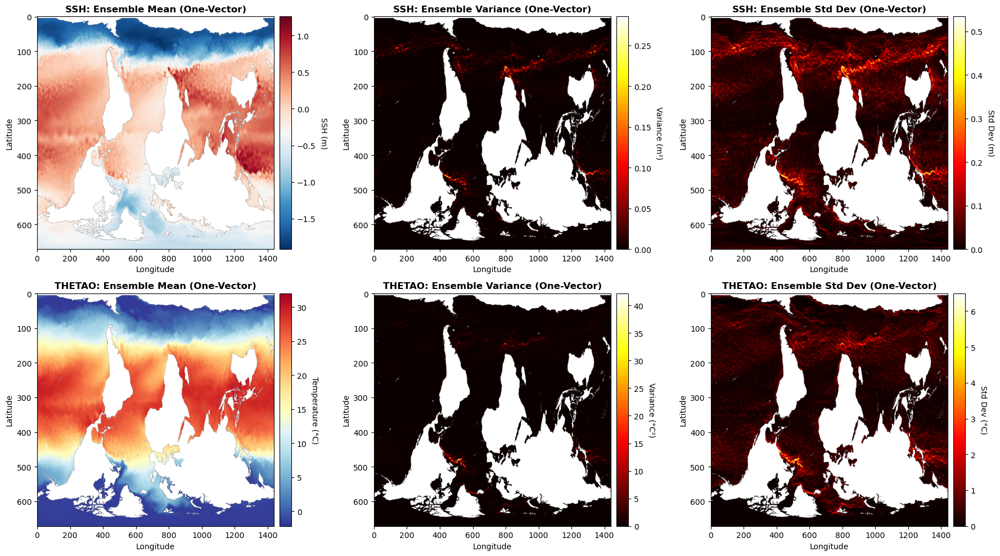


Visualization complete!


In [47]:
# Visualize ensemble mean and variance (one-vector method)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# SSH Mean
im0 = axes[0, 0].imshow(ssh_mean, cmap='RdBu_r', aspect='auto')
axes[0, 0].set_title('SSH: Ensemble Mean (One-Vector)', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Longitude')
axes[0, 0].set_ylabel('Latitude')
cbar0 = plt.colorbar(im0, ax=axes[0, 0], orientation='vertical', pad=0.02)
cbar0.set_label('SSH (m)', rotation=270, labelpad=15)

# SSH Variance
im1 = axes[0, 1].imshow(ssh_var, cmap='hot', aspect='auto')
axes[0, 1].set_title('SSH: Ensemble Variance (One-Vector)', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Longitude')
axes[0, 1].set_ylabel('Latitude')
cbar1 = plt.colorbar(im1, ax=axes[0, 1], orientation='vertical', pad=0.02)
cbar1.set_label('Variance (m²)', rotation=270, labelpad=15)

# SSH Std Dev
im2 = axes[0, 2].imshow(ssh_std, cmap='hot', aspect='auto')
axes[0, 2].set_title('SSH: Ensemble Std Dev (One-Vector)', fontsize=12, fontweight='bold')
axes[0, 2].set_xlabel('Longitude')
axes[0, 2].set_ylabel('Latitude')
cbar2 = plt.colorbar(im2, ax=axes[0, 2], orientation='vertical', pad=0.02)
cbar2.set_label('Std Dev (m)', rotation=270, labelpad=15)

# THETAO Mean
im3 = axes[1, 0].imshow(thetao_mean, cmap='RdYlBu_r', aspect='auto')
axes[1, 0].set_title('THETAO: Ensemble Mean (One-Vector)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Longitude')
axes[1, 0].set_ylabel('Latitude')
cbar3 = plt.colorbar(im3, ax=axes[1, 0], orientation='vertical', pad=0.02)
cbar3.set_label('Temperature (°C)', rotation=270, labelpad=15)

# THETAO Variance
im4 = axes[1, 1].imshow(thetao_var, cmap='hot', aspect='auto')
axes[1, 1].set_title('THETAO: Ensemble Variance (One-Vector)', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Longitude')
axes[1, 1].set_ylabel('Latitude')
cbar4 = plt.colorbar(im4, ax=axes[1, 1], orientation='vertical', pad=0.02)
cbar4.set_label('Variance (°C²)', rotation=270, labelpad=15)

# THETAO Std Dev
im5 = axes[1, 2].imshow(thetao_std, cmap='hot', aspect='auto')
axes[1, 2].set_title('THETAO: Ensemble Std Dev (One-Vector)', fontsize=12, fontweight='bold')
axes[1, 2].set_xlabel('Longitude')
axes[1, 2].set_ylabel('Latitude')
cbar5 = plt.colorbar(im5, ax=axes[1, 2], orientation='vertical', pad=0.02)
cbar5.set_label('Std Dev (°C)', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

print("\nVisualization complete!")

### Pointwise Method: Ensemble Mean and Variance

In [48]:
# Calculate ensemble mean and variance for raw values (pointwise method)
print("Calculating ensemble mean and variance for SSH and THETAO (pointwise method)...")
print("="*70)

# Store all ensemble member values for surface only
ssh_ensemble_pointwise = []
thetao_ensemble_pointwise = []

# Process each ensemble member - only those with depth 0 (surface)
for idx, member in enumerate(pointwise_multi_ensemble_t1):
    # Only process surface members (depth 0)
    if member['depth'] != 0:
        continue
        
    # Get perturbed data for this member
    ssh_member = member['displaced_channels']['ch0_ssh']
    thetao_member = member['displaced_channels']['ch1_thetao']
    
    ssh_ensemble_pointwise.append(ssh_member)
    thetao_ensemble_pointwise.append(thetao_member)

# Convert to numpy arrays: shape (n_members, height, width)
ssh_ensemble_pointwise = np.array(ssh_ensemble_pointwise)
thetao_ensemble_pointwise = np.array(thetao_ensemble_pointwise)

print(f"\nEnsemble shapes:")
print(f"  SSH: {ssh_ensemble_pointwise.shape}")
print(f"  THETAO: {thetao_ensemble_pointwise.shape}")
print(f"  Number of surface ensemble members: {len(ssh_ensemble_pointwise)}")

# Calculate mean and variance across ensemble members (axis=0)
ssh_mean_pointwise = np.mean(ssh_ensemble_pointwise, axis=0)
ssh_var_pointwise = np.var(ssh_ensemble_pointwise, axis=0)
ssh_std_pointwise = np.sqrt(ssh_var_pointwise)

thetao_mean_pointwise = np.mean(thetao_ensemble_pointwise, axis=0)
thetao_var_pointwise = np.var(thetao_ensemble_pointwise, axis=0)
thetao_std_pointwise = np.sqrt(thetao_var_pointwise)

print(f"\nSSH Statistics (Pointwise):")
print(f"  Mean range: [{np.nanmin(ssh_mean_pointwise):.4f}, {np.nanmax(ssh_mean_pointwise):.4f}]")
print(f"  Variance range: [{np.nanmin(ssh_var_pointwise):.6f}, {np.nanmax(ssh_var_pointwise):.6f}]")
print(f"  Std Dev range: [{np.nanmin(ssh_std_pointwise):.6f}, {np.nanmax(ssh_std_pointwise):.6f}]")
print(f"  Mean std: {np.nanmean(ssh_std_pointwise):.6f}")

print(f"\nTHETAO Statistics (Pointwise):")
print(f"  Mean range: [{np.nanmin(thetao_mean_pointwise):.4f}, {np.nanmax(thetao_mean_pointwise):.4f}]")
print(f"  Variance range: [{np.nanmin(thetao_var_pointwise):.6f}, {np.nanmax(thetao_var_pointwise):.6f}]")
print(f"  Std Dev range: [{np.nanmin(thetao_std_pointwise):.6f}, {np.nanmax(thetao_std_pointwise):.6f}]")
print(f"  Mean std: {np.nanmean(thetao_std_pointwise):.6f}")

# Calculate coefficient of variation
ssh_cv_pointwise = ssh_std_pointwise / np.abs(ssh_mean_pointwise)
thetao_cv_pointwise = thetao_std_pointwise / np.abs(thetao_mean_pointwise)

print(f"\nCoefficient of Variation (CV = std/|mean|):")
print(f"  SSH CV range: [{np.nanmin(ssh_cv_pointwise):.6f}, {np.nanmax(ssh_cv_pointwise):.6f}]")
print(f"  SSH mean CV: {np.nanmean(ssh_cv_pointwise):.6f}")
print(f"  THETAO CV range: [{np.nanmin(thetao_cv_pointwise):.6f}, {np.nanmax(thetao_cv_pointwise):.6f}]")
print(f"  THETAO mean CV: {np.nanmean(thetao_cv_pointwise):.6f}")

Calculating ensemble mean and variance for SSH and THETAO (pointwise method)...

Ensemble shapes:
  SSH: (150, 672, 1440)
  THETAO: (150, 672, 1440)
  Number of surface ensemble members: 150

SSH Statistics (Pointwise):
  Mean range: [-1.9257, 1.4686]
  Variance range: [0.000000, 0.010525]
  Std Dev range: [0.000000, 0.102593]
  Mean std: 0.000476

THETAO Statistics (Pointwise):
  Mean range: [-2.3599, 32.1818]
  Variance range: [0.000000, 0.918991]
  Std Dev range: [0.000000, 0.958640]
  Mean std: 0.003970

Coefficient of Variation (CV = std/|mean|):
  SSH CV range: [0.000000, 1401.322478]
  SSH mean CV: 0.009262
  THETAO CV range: [0.000000, 41.160810]
  THETAO mean CV: 0.001484


/tmp/ipykernel_863165/1351747377.py:53: RuntimeWarning: invalid value encountered in divide
  ssh_cv_pointwise = ssh_std_pointwise / np.abs(ssh_mean_pointwise)


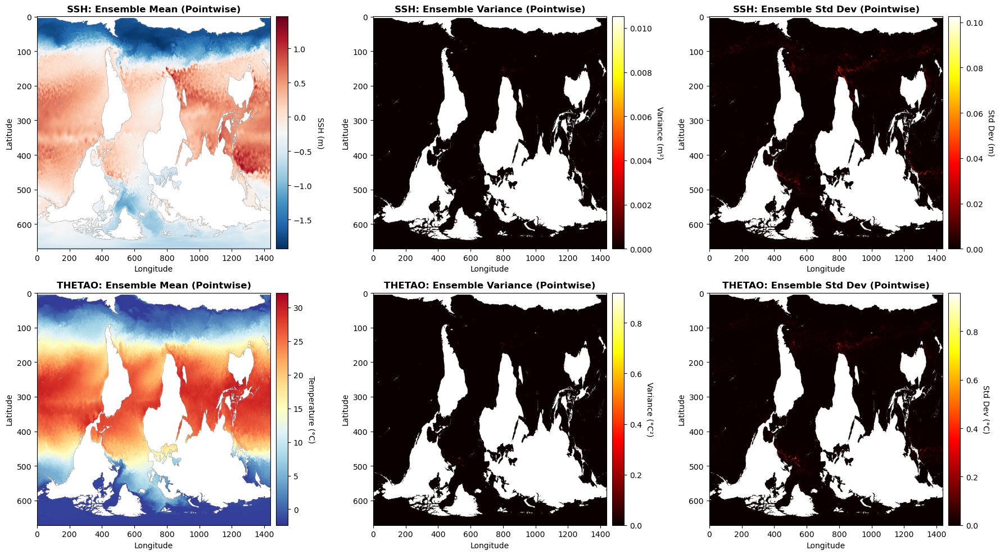


Visualization complete!


In [49]:
# Visualize ensemble mean and variance (pointwise method)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# SSH Mean
im0 = axes[0, 0].imshow(ssh_mean_pointwise, cmap='RdBu_r', aspect='auto')
axes[0, 0].set_title('SSH: Ensemble Mean (Pointwise)', fontsize=12, fontweight='bold')
axes[0, 0].set_xlabel('Longitude')
axes[0, 0].set_ylabel('Latitude')
cbar0 = plt.colorbar(im0, ax=axes[0, 0], orientation='vertical', pad=0.02)
cbar0.set_label('SSH (m)', rotation=270, labelpad=15)

# SSH Variance
im1 = axes[0, 1].imshow(ssh_var_pointwise, cmap='hot', aspect='auto')
axes[0, 1].set_title('SSH: Ensemble Variance (Pointwise)', fontsize=12, fontweight='bold')
axes[0, 1].set_xlabel('Longitude')
axes[0, 1].set_ylabel('Latitude')
cbar1 = plt.colorbar(im1, ax=axes[0, 1], orientation='vertical', pad=0.02)
cbar1.set_label('Variance (m²)', rotation=270, labelpad=15)

# SSH Std Dev
im2 = axes[0, 2].imshow(ssh_std_pointwise, cmap='hot', aspect='auto')
axes[0, 2].set_title('SSH: Ensemble Std Dev (Pointwise)', fontsize=12, fontweight='bold')
axes[0, 2].set_xlabel('Longitude')
axes[0, 2].set_ylabel('Latitude')
cbar2 = plt.colorbar(im2, ax=axes[0, 2], orientation='vertical', pad=0.02)
cbar2.set_label('Std Dev (m)', rotation=270, labelpad=15)

# THETAO Mean
im3 = axes[1, 0].imshow(thetao_mean_pointwise, cmap='RdYlBu_r', aspect='auto')
axes[1, 0].set_title('THETAO: Ensemble Mean (Pointwise)', fontsize=12, fontweight='bold')
axes[1, 0].set_xlabel('Longitude')
axes[1, 0].set_ylabel('Latitude')
cbar3 = plt.colorbar(im3, ax=axes[1, 0], orientation='vertical', pad=0.02)
cbar3.set_label('Temperature (°C)', rotation=270, labelpad=15)

# THETAO Variance
im4 = axes[1, 1].imshow(thetao_var_pointwise, cmap='hot', aspect='auto')
axes[1, 1].set_title('THETAO: Ensemble Variance (Pointwise)', fontsize=12, fontweight='bold')
axes[1, 1].set_xlabel('Longitude')
axes[1, 1].set_ylabel('Latitude')
cbar4 = plt.colorbar(im4, ax=axes[1, 1], orientation='vertical', pad=0.02)
cbar4.set_label('Variance (°C²)', rotation=270, labelpad=15)

# THETAO Std Dev
im5 = axes[1, 2].imshow(thetao_std_pointwise, cmap='hot', aspect='auto')
axes[1, 2].set_title('THETAO: Ensemble Std Dev (Pointwise)', fontsize=12, fontweight='bold')
axes[1, 2].set_xlabel('Longitude')
axes[1, 2].set_ylabel('Latitude')
cbar5 = plt.colorbar(im5, ax=axes[1, 2], orientation='vertical', pad=0.02)
cbar5.set_label('Std Dev (°C)', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

print("\nVisualization complete!")

# Convert to xarray Dataset #

Convert the full ensemble members back to xarray format with proper coordinates for GLONET input.

In [53]:
import os

In [57]:
def save_glonet_ensemble_one_vector(ensemble_t0, ensemble_t1, ds, output_dir, prefix="one_vector"):
    """
    Save one_vector ensemble members in Glonet input format.
    One_vector stores all depths in each member with prefix d{depth}_{channel}.
    
    Parameters:
    -----------
    ensemble_t0 : list
        List of ensemble members at t0
    ensemble_t1 : list
        List of ensemble members at t1
    ds : xr.Dataset
        Dataset containing time, lat, lon coordinates
    output_dir : str
        Output directory path
    prefix : str
        Prefix for output files
    """
    os.makedirs(output_dir, exist_ok=True)
    
    # Extract time, lat, lon coordinates from original file
    time_coords = ds["time"].values
    lat_coords = ds["lat"].values
    lon_coords = ds["lon"].values
    
    print(f"Saving {len(ensemble_t0)} one_vector ensemble members...")
    print(f"Time coordinates: {time_coords}")
    print(f"Lat shape: {lat_coords.shape}, Lon shape: {lon_coords.shape}")
    
    # Process each member
    for member_t0, member_t1 in zip(ensemble_t0, ensemble_t1):
        member_idx = member_t0['member_idx']
        
        # Initialize arrays for each file - shape will be (time=2, ch, lat, lon)
        surface_data_t0 = []  # 5 channels
        shallow_data_t0 = []  # 40 channels (4 vars * 10 depths)
        deep_data_t0 = []     # 40 channels (4 vars * 10 depths)
        
        surface_data_t1 = []  # 5 channels
        shallow_data_t1 = []  # 40 channels
        deep_data_t1 = []     # 40 channels
        
        # Extract surface data (depth 0) - channels: ssh, thetao, so, uo, vo
        surface_data_t0 = [
            member_t0['displaced_channels']['d0_ch0_ssh'],
            member_t0['displaced_channels']['d0_ch1_thetao'],
            member_t0['displaced_channels']['d0_ch2_so'],
            member_t0['displaced_channels']['d0_ch3_uo'],
            member_t0['displaced_channels']['d0_ch4_vo']
        ]
        
        surface_data_t1 = [
            member_t1['displaced_channels']['d0_ch0_ssh'],
            member_t1['displaced_channels']['d0_ch1_thetao'],
            member_t1['displaced_channels']['d0_ch2_so'],
            member_t1['displaced_channels']['d0_ch3_uo'],
            member_t1['displaced_channels']['d0_ch4_vo']
        ]
        
        # Extract shallow data (depths 1-10)
        # For each depth: thetao, so, uo, vo
        for d in range(1, 11):
            # Channel indices: 
            # thetao: ch(5+d-1), so: ch(15+d-1), uo: ch(25+d-1), vo: ch(34+d-1)
            base_t = 5 + d - 1
            base_s = 15 + d - 1
            base_u = 25 + d - 1
            base_v = 35 + d - 1
            
            shallow_data_t0.extend([
                member_t0['displaced_channels'][f'd{d}_ch{base_t}_thetao'],
                member_t0['displaced_channels'][f'd{d}_ch{base_s}_so'],
                member_t0['displaced_channels'][f'd{d}_ch{base_u}_uo'],
                member_t0['displaced_channels'][f'd{d}_ch{base_v}_vo']
            ])
            
            shallow_data_t1.extend([
                member_t1['displaced_channels'][f'd{d}_ch{base_t}_thetao'],
                member_t1['displaced_channels'][f'd{d}_ch{base_s}_so'],
                member_t1['displaced_channels'][f'd{d}_ch{base_u}_uo'],
                member_t1['displaced_channels'][f'd{d}_ch{base_v}_vo']
            ])
        
        # Extract deep data (depths 11-20)
        for d in range(11, 21):
            # Channel indices:
            # thetao: ch(35+d-1), so: ch(45+d-1), uo: ch(55+d-1), vo: ch(64+d-1)
            base_t = 35 + d - 1
            base_s = 45 + d - 1
            base_u = 55 + d - 1
            base_v = 65 + d - 1
            
            deep_data_t0.extend([
                member_t0['displaced_channels'][f'd{d}_ch{base_t}_thetao'],
                member_t0['displaced_channels'][f'd{d}_ch{base_s}_so'],
                member_t0['displaced_channels'][f'd{d}_ch{base_u}_uo'],
                member_t0['displaced_channels'][f'd{d}_ch{base_v}_vo']
            ])
            
            deep_data_t1.extend([
                member_t1['displaced_channels'][f'd{d}_ch{base_t}_thetao'],
                member_t1['displaced_channels'][f'd{d}_ch{base_s}_so'],
                member_t1['displaced_channels'][f'd{d}_ch{base_u}_uo'],
                member_t1['displaced_channels'][f'd{d}_ch{base_v}_vo']
            ])
        
        # Stack t0 and t1 along time dimension: shape (2, ch, lat, lon)
        surface_array = np.stack([np.array(surface_data_t0), np.array(surface_data_t1)], axis=0)
        shallow_array = np.stack([np.array(shallow_data_t0), np.array(shallow_data_t1)], axis=0)
        deep_array = np.stack([np.array(deep_data_t0), np.array(deep_data_t1)], axis=0)
        
        # Create xarray datasets
        input1 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], surface_array)
            },
            coords={
                'time': time_coords,
                'ch': range(5),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        input2 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], shallow_array)
            },
            coords={
                'time': time_coords,
                'ch': range(40),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        input3 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], deep_array)
            },
            coords={
                'time': time_coords,
                'ch': range(40),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        # Save to netCDF files
        member_dir = os.path.join(output_dir, f"member_{member_idx:03d}")
        os.makedirs(member_dir, exist_ok=True)
        
        input1.to_netcdf(os.path.join(member_dir, f"{prefix}_input1.nc"))
        input2.to_netcdf(os.path.join(member_dir, f"{prefix}_input2.nc"))
        input3.to_netcdf(os.path.join(member_dir, f"{prefix}_input3.nc"))
        
        if member_idx % 10 == 0:
            print(f"  Saved member {member_idx}/{len(ensemble_t0)}")
    
    print(f"✓ Completed saving {len(ensemble_t0)} one_vector ensemble members")
    print(f"  Output directory: {output_dir}")



In [58]:

def save_glonet_ensemble_pointwise(ensemble_t0, ensemble_t1, ds, output_dir, prefix="pointwise"):
    """
    Save pointwise ensemble members in Glonet input format.
    Pointwise stores each depth separately, need to reorganize by member_idx.
    
    Parameters:
    -----------
    ensemble_t0 : list
        List of ensemble members at t0 (organized by channel/depth)
    ensemble_t1 : list
        List of ensemble members at t1 (organized by channel/depth)
    ds : xr.Dataset
        Dataset containing time, lat, lon coordinates
    output_dir : str
        Output directory path
    prefix : str
        Prefix for output files
    """
    os.makedirs(output_dir, exist_ok=True)
    
    # Extract time, lat, lon coordinates from original file
    time_coords = ds["time"].values
    lat_coords = ds["lat"].values
    lon_coords = ds["lon"].values
    
    print(f"Saving {len(set([m['member_idx'] for m in ensemble_t0]))} pointwise ensemble members...")
    print(f"Time coordinates: {time_coords}")
    print(f"Lat shape: {lat_coords.shape}, Lon shape: {lon_coords.shape}")
    
    # Group members by member_idx
    members_by_idx_t0 = {}
    for member in ensemble_t0:
        idx = member['member_idx']
        depth = member['depth']
        if idx not in members_by_idx_t0:
            members_by_idx_t0[idx] = {}
        members_by_idx_t0[idx][depth] = member
    
    members_by_idx_t1 = {}
    for member in ensemble_t1:
        idx = member['member_idx']
        depth = member['depth']
        if idx not in members_by_idx_t1:
            members_by_idx_t1[idx] = {}
        members_by_idx_t1[idx][depth] = member
    
    # Process each member
    for member_idx in sorted(members_by_idx_t0.keys()):
        member_depths_t0 = members_by_idx_t0[member_idx]
        member_depths_t1 = members_by_idx_t1[member_idx]
        
        # Initialize arrays for each file
        surface_data_t0 = []  # 5 channels
        shallow_data_t0 = []  # 40 channels
        deep_data_t0 = []     # 40 channels
        
        surface_data_t1 = []  # 5 channels
        shallow_data_t1 = []  # 40 channels
        deep_data_t1 = []     # 40 channels
        
        # Extract surface data (depth 0)
        if 0 in member_depths_t0:
            d0_t0 = member_depths_t0[0]
            surface_data_t0 = [
                d0_t0['displaced_channels']['ch0_ssh'],
                d0_t0['displaced_channels']['ch1_thetao'],
                d0_t0['displaced_channels']['ch2_so'],
                d0_t0['displaced_channels']['ch3_uo'],
                d0_t0['displaced_channels']['ch4_vo']
            ]
        
        if 0 in member_depths_t1:
            d0_t1 = member_depths_t1[0]
            surface_data_t1 = [
                d0_t1['displaced_channels']['ch0_ssh'],
                d0_t1['displaced_channels']['ch1_thetao'],
                d0_t1['displaced_channels']['ch2_so'],
                d0_t1['displaced_channels']['ch3_uo'],
                d0_t1['displaced_channels']['ch4_vo']
            ]
        
        # Extract shallow data (depths 1-10)
        for d in range(1, 11):
            if d in member_depths_t0:
                member_d_t0 = member_depths_t0[d]
                base_t = 5 + d - 1
                base_s = 15 + d - 1
                base_u = 25 + d - 1
                base_v = 35 + d - 1
                
                shallow_data_t0.extend([
                    member_d_t0['displaced_channels'][f'ch{base_t}_thetao'],
                    member_d_t0['displaced_channels'][f'ch{base_s}_so'],
                    member_d_t0['displaced_channels'][f'ch{base_u}_uo'],
                    member_d_t0['displaced_channels'][f'ch{base_v}_vo']
                ])
            
            if d in member_depths_t1:
                member_d_t1 = member_depths_t1[d]
                base_t = 5 + d - 1
                base_s = 15 + d - 1
                base_u = 25 + d - 1
                base_v = 35 + d - 1
                
                shallow_data_t1.extend([
                    member_d_t1['displaced_channels'][f'ch{base_t}_thetao'],
                    member_d_t1['displaced_channels'][f'ch{base_s}_so'],
                    member_d_t1['displaced_channels'][f'ch{base_u}_uo'],
                    member_d_t1['displaced_channels'][f'ch{base_v}_vo']
                ])
        
        # Extract deep data (depths 11-20)
        for d in range(11, 21):
            if d in member_depths_t0:
                member_d_t0 = member_depths_t0[d]
                base_t = 35 + d - 1
                base_s = 45 + d - 1
                base_u = 55 + d - 1
                base_v = 65 + d - 1
                
                deep_data_t0.extend([
                    member_d_t0['displaced_channels'][f'ch{base_t}_thetao'],
                    member_d_t0['displaced_channels'][f'ch{base_s}_so'],
                    member_d_t0['displaced_channels'][f'ch{base_u}_uo'],
                    member_d_t0['displaced_channels'][f'ch{base_v}_vo']
                ])
            
            if d in member_depths_t1:
                member_d_t1 = member_depths_t1[d]
                base_t = 35 + d - 1
                base_s = 45 + d - 1
                base_u = 55 + d - 1
                base_v = 65 + d - 1
                
                deep_data_t1.extend([
                    member_d_t1['displaced_channels'][f'ch{base_t}_thetao'],
                    member_d_t1['displaced_channels'][f'ch{base_s}_so'],
                    member_d_t1['displaced_channels'][f'ch{base_u}_uo'],
                    member_d_t1['displaced_channels'][f'ch{base_v}_vo']
                ])
        
        # Stack t0 and t1 along time dimension
        surface_array = np.stack([np.array(surface_data_t0), np.array(surface_data_t1)], axis=0)
        shallow_array = np.stack([np.array(shallow_data_t0), np.array(shallow_data_t1)], axis=0)
        deep_array = np.stack([np.array(deep_data_t0), np.array(deep_data_t1)], axis=0)
        
        # Create xarray datasets
        input1 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], surface_array)
            },
            coords={
                'time': time_coords,
                'ch': range(5),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        input2 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], shallow_array)
            },
            coords={
                'time': time_coords,
                'ch': range(40),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        input3 = xr.Dataset(
            {
                'data': (['time', 'ch', 'lat', 'lon'], deep_array)
            },
            coords={
                'time': time_coords,
                'ch': range(40),
                'lat': lat_coords,
                'lon': lon_coords
            }
        )
        
        # Save to netCDF files
        member_dir = os.path.join(output_dir, f"member_{member_idx:03d}")
        os.makedirs(member_dir, exist_ok=True)
        
        input1.to_netcdf(os.path.join(member_dir, f"{prefix}_input1.nc"))
        input2.to_netcdf(os.path.join(member_dir, f"{prefix}_input2.nc"))
        input3.to_netcdf(os.path.join(member_dir, f"{prefix}_input3.nc"))
        
        if member_idx % 10 == 0:
            print(f"  Saved member {member_idx}/{len(members_by_idx_t0)}")
    
    print(f"✓ Completed saving {len(members_by_idx_t0)} pointwise ensemble members")
    print(f"  Output directory: {output_dir}")


In [59]:
save_glonet_ensemble_one_vector(one_vector_multi_ensemble_t0, 
                                one_vector_multi_ensemble_t1, 
                                ds, 
                                output_dir="glonet_ensemble_one_vector", 
                                prefix="one_vector")

Saving 40 one_vector ensemble members...
Time coordinates: ['1993-01-01T00:00:00.000000000' '1993-01-02T00:00:00.000000000']
Lat shape: (672,), Lon shape: (1440,)
There are 67 HDF5 objects open!

Report: open objects on 72057594037927939


Type = File(72057594037927936) name='/'Type = File(72057594037927937) name='/'Type = File(72057594037927938) name='/'[sl-mee-br-208:863165:0:863165] Caught signal 11 (Segmentation fault: address not mapped to object at address 0x5b0)


: 

In [ ]:
save_glonet_ensemble_pointwise(pointwise_multi_ensemble_t0, 
                              pointwise_multi_ensemble_t1, 
                              ds,
                              output_dir="glonet_ensemble_pointwise", 
                              prefix="pointwise")